## CIS 580, Machine Perception, Spring 2023
### Homework 5
#### Due: Thursday April 27th 2023, 11:59pm ET

Instructions: Create a folder in your Google Drive and place inside this .ipynb file. Open the jupyter notebook with Google Colab. Refrain from using a GPU during implementing and testing the whole thing. You should switch to a GPU runtime only when performing the final training (of the 2D image or the NeRF) to avoid GPU usage runouts.

### Part 1: Fitting a 2D Image

In [ ]:
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import time
import gdown
from tqdm import tqdm


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


cuda


We first download the image from the web. We normalize the image so the pixels are in between the range of [0,1].

In [ ]:
url = "https://drive.google.com/file/d/1-Cugk9WiFX2CPjWG5taX3868Gdd0PEVT/view?usp=share_link"
gdown.download(url=url, output='starry_night.jpg', quiet=False, fuzzy=True)

# Load painting image
painting = imageio.imread("starry_night.jpg")
painting = torch.from_numpy(
    np.array(painting, dtype=np.float32)/255.).to(device)
height_painting, width_painting = painting.shape[:2]


Downloading...
From: https://drive.google.com/uc?id=1-Cugk9WiFX2CPjWG5taX3868Gdd0PEVT
To: /content/starry_night.jpg
100%|██████████| 5.65k/5.65k [00:00<00:00, 5.26MB/s]


1.1 Complete the function positional_encoding()

In [ ]:
def positional_encoding(x, num_frequencies=6, incl_input=True):
    """
    Apply positional encoding to the input.

    Args:
    x (torch.Tensor): Input tensor to be positionally encoded.
      The dimension of x is [N, D], where N is the number of input coordinates,
      and D is the dimension of the input coordinate.
    num_frequencies (optional, int): The number of frequencies used in
     the positional encoding (default: 6).
    incl_input (optional, bool): If True, concatenate the input with the
        computed positional encoding (default: True).

    Returns:
    (torch.Tensor): Positional encoding of the input tensor.
    """

    results = []
    if incl_input:
        results.append(x)
    #############################  TODO 1(a) BEGIN  ############################
    # encode input tensor and append the encoded tensor to the list of results.

    for i in range(num_frequencies):
        s = torch.sin(x * 2**i * torch.pi)
        c = torch.cos(x * 2**i * torch.pi)
        results.append(s)
        results.append(c)
        # print("Results: ", results)
    #############################  TODO 1(a) END  ##############################
    return torch.cat(results, dim=-1)


1.2 Complete the class model_2d() that will be used to fit the 2D image.


In [ ]:
class model_2d(nn.Module):

    """
    Define a 2D model comprising of three fully connected layers,
    two relu activations and one sigmoid activation.
    """

    def __init__(self, filter_size=128, num_frequencies=6):
        super().__init__()
        #############################  TODO 1(b) BEGIN  ############################
        self.layer1 = nn.Linear(2*num_frequencies*2 + 2, filter_size)
        self.layer2 = nn.Linear(filter_size, filter_size)
        self.layer3 = nn.Linear(filter_size, 3)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        #############################  TODO 1(b) END  ##############################

    def forward(self, x):
        #############################  TODO 1(b) BEGIN  ############################
        x = self.layer1(x)
        x = self.relu(x)
        x = self.layer2(x)
        x = self.relu(x)
        x = self.layer3(x)
        x = self.sigmoid(x)
        #############################  TODO 1(b) END  ##############################
        return x


You need to complete 1.1 and 1.2 first before completing the train_2d_model function. Don't forget to transfer the completed functions from 1.1 and 1.2 to the part1.py file and upload it to the autograder.

Fill the gaps in the train_2d_model() function to train the model to fit the 2D image.

In [ ]:
# X = torch.stack(torch.meshgrid(torch.linspace(0, 1, height_painting),
#                 torch.linspace(0, 1, width_painting))).view(-1, 2).to(device)
# # X = positional_encoding(X, num_frequencies=num_frequencies)
# pos_encode = positional_encoding(X)


In [ ]:
# (width_painting*height_painting*6)* 2 + width_painting*height_painting


In [ ]:
def train_2d_model(test_img, num_frequencies, device, model=model_2d, positional_encoding=positional_encoding, show=True):

    # Optimizer parameters
    lr = 5e-4
    iterations = 10000
    height, width = test_img.shape[:2]

    # Number of iters after which stats are displayed
    display = 2000

    # Define the model and initialize its weights.
    model2d = model(num_frequencies=num_frequencies)
    model2d.to(device)

    def weights_init(m):
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight)

    model2d.apply(weights_init)

    #############################  TODO 1(c) BEGIN  ############################
    # Define the optimizer
    optimizer = torch.optim.Adam(model2d.parameters(), lr=lr)

    #############################  TODO 1(c) END  ############################

    # Seed RNG, for repeatability
    seed = 5670
    torch.manual_seed(seed)
    np.random.seed(seed)

    # Lists to log metrics etc.
    psnrs = []
    iternums = []

    t = time.time()
    t0 = time.time()

    #############################  TODO 1(c) BEGIN  ############################
    # Create the 2D normalized coordinates, and apply positional encoding to them
    ix = torch.linspace(0, 1, width)
    iy = torch.linspace(0, 1, height)
    x = torch.zeros((height*width, 2))
    for i in range(height):
        for j in range(width):
            x[i*width + j] = torch.tensor([ix[j], iy[i]])
    X = positional_encoding(x, num_frequencies=num_frequencies).to(device)
    #############################  TODO 1(c) END  ############################

    for i in tqdm(range(iterations+1)):
        optimizer.zero_grad()
        #############################  TODO 1(c) BEGIN  ############################
        # Run one iteration
        pred = model2d.forward(x=X)
        pred = pred.reshape((height, width, 3))
        # Compute mean-squared error between the predicted and target images. Backprop!
        loss = F.mse_loss(pred, test_img)
        loss.backward()
        optimizer.step()
        #############################  TODO 1(c) END  ############################

        # Display images/plots/stats
        if i % display == 0 and show:
            #############################  TODO 1(c) BEGIN  ############################
            # Calculate psnr
            psnr = 10 * torch.log10(1 / loss)
            #############################  TODO 1(c) END  ############################

            print("Iteration %d " % i, "Loss: %.4f " % loss.item(), "PSNR: %.2f" % psnr.item(),
                  "Time: %.2f secs per iter" % ((time.time() - t) / display), "%.2f secs in total" % (time.time() - t0))
            t = time.time()

            psnrs.append(psnr.item())
            iternums.append(i)

            plt.figure(figsize=(13, 4))
            plt.subplot(131)
            plt.imshow(pred.detach().cpu().numpy().reshape((height, width, 3)))
            plt.title(f"Iteration {i}")
            plt.subplot(132)
            plt.imshow(test_img.cpu().numpy())
            plt.title("Target image")
            plt.subplot(133)
            plt.plot(iternums, psnrs)
            plt.title("PSNR")
            plt.show()

            # if i==iterations:
            #  np.save('result_'+str(num_frequencies)+'.npz',pred.detach().cpu().numpy())

    print('Done!')
    return pred.detach().cpu()


Train the model to fit the given image without applying positional encoding to the input, and by applying positional encoding of two different frequencies to the input; L = 2 and L = 6.

  0%|          | 0/10001 [00:00<?, ?it/s]

Iteration 0  Loss: 0.0443  PSNR: 13.53 Time: 0.00 secs per iter 2.84 secs in total


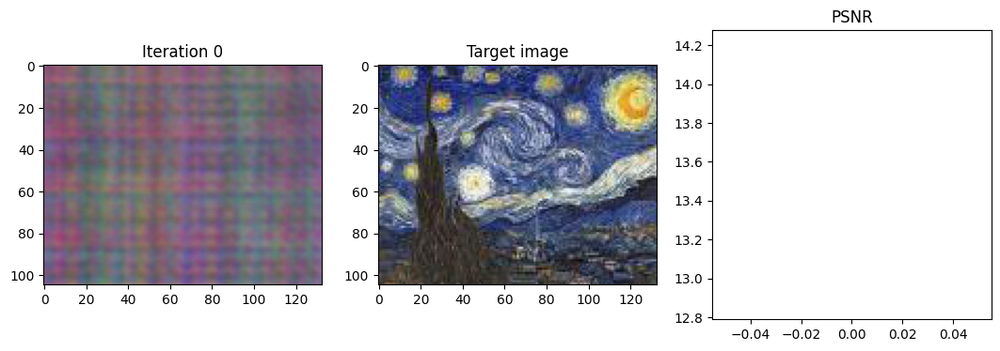

 19%|█▉        | 1929/10001 [00:05<00:11, 720.05it/s]

Iteration 2000  Loss: 0.0033  PSNR: 24.84 Time: 0.00 secs per iter 6.15 secs in total


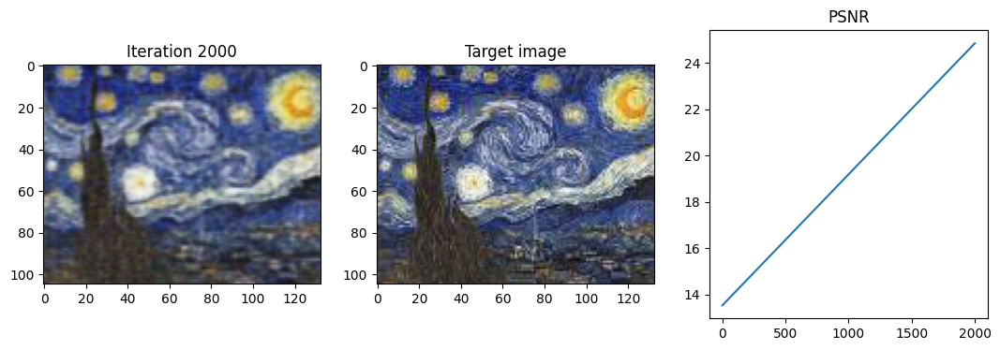

 40%|███▉      | 3980/10001 [00:09<00:08, 727.62it/s]

Iteration 4000  Loss: 0.0025  PSNR: 26.09 Time: 0.00 secs per iter 9.92 secs in total


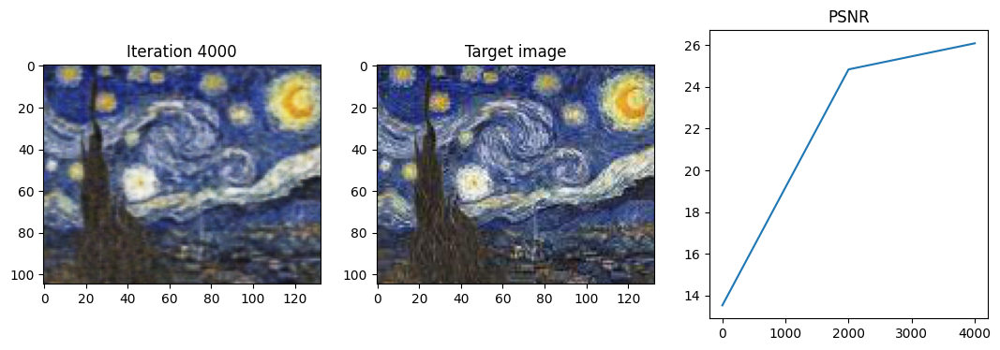

 60%|█████▉    | 5975/10001 [00:13<00:05, 710.23it/s]

Iteration 6000  Loss: 0.0020  PSNR: 26.88 Time: 0.00 secs per iter 13.32 secs in total


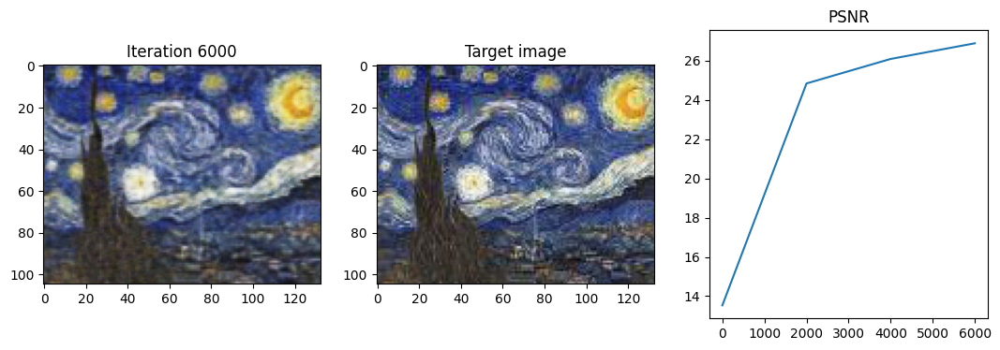

 79%|███████▉  | 7933/10001 [00:16<00:03, 685.87it/s]

Iteration 8000  Loss: 0.0018  PSNR: 27.43 Time: 0.00 secs per iter 16.66 secs in total


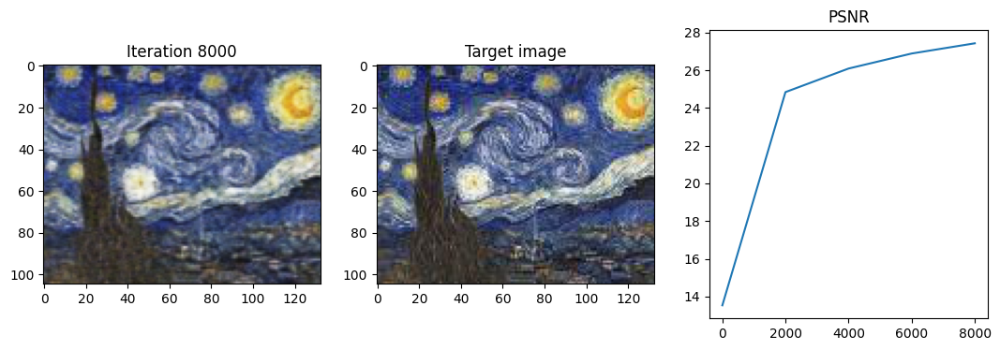

100%|█████████▉| 9976/10001 [00:19<00:00, 583.27it/s]

Iteration 10000  Loss: 0.0016  PSNR: 27.95 Time: 0.00 secs per iter 20.27 secs in total


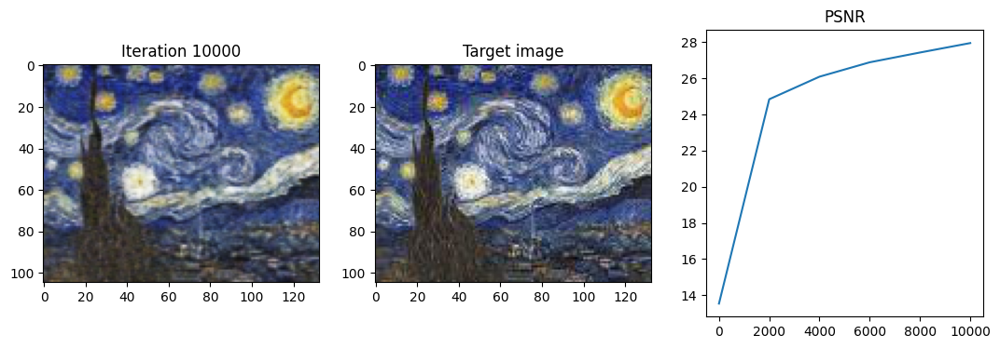

100%|██████████| 10001/10001 [00:20<00:00, 480.75it/s]

Done!


In [ ]:
_ = train_2d_model(test_img=painting, num_frequencies=6, device=device)


### Part 2: Fitting a 3D Image

In [ ]:
import os
import gdown
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
import time
from tqdm import tqdm
from google.colab import drive
drive.mount('/content/gdrive')


device = torch.device( "cuda")
print(device)


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
cuda


In [ ]:
url = "https://drive.google.com/file/d/15W2EK8LooxTMfD0v5vo2BnBMse5ZzlVj/view?usp=share_link"
gdown.download(url=url, output='lego_data.npz', quiet=False, fuzzy=True)


Downloading...
From: https://drive.google.com/uc?id=15W2EK8LooxTMfD0v5vo2BnBMse5ZzlVj
To: /content/lego_data.npz
100%|██████████| 12.7M/12.7M [00:00<00:00, 117MB/s]


'lego_data.npz'

Here, we load the data that is comprised by the images, the R and T matrices of each camera position with respect to the world coordinates and the intrinsics parameters K of the camera.

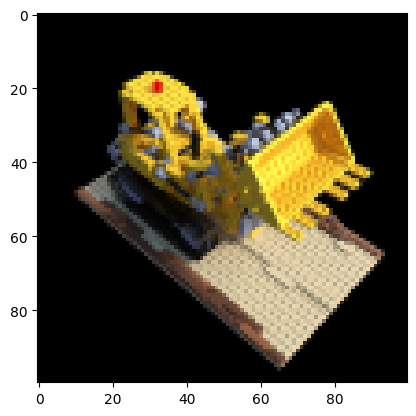

In [ ]:
# Load input images, poses, and intrinsics
data = np.load("lego_data.npz")

# Images
images = data["images"]

# Height and width of each image
height, width = images.shape[1:3]

# Camera extrinsics (poses)
poses = data["poses"]
poses = torch.from_numpy(poses).to(device)

# Camera intrinsics
intrinsics = data["intrinsics"]
intrinsics = torch.from_numpy(intrinsics).to(device)

# Hold one image out (for test).
test_image, test_pose = images[101], poses[101]
test_image = torch.from_numpy(test_image).to(device)

# Map images to device
images = torch.from_numpy(images[:100, ..., :3]).to(device)

plt.imshow(test_image.detach().cpu().numpy())
plt.show()


2.1 Complete the following function that calculates the rays that pass through all the pixels of an HxW image

In [ ]:
def get_rays(height, width, intrinsics, Rcw, Tcw):
    """
    Compute the origin and direction of rays passing through all pixels of an image (one ray per pixel).

    Args:
    height: the height of an image.
    width: the width of an image.
    intrinsics: camera intrinsics matrix of shape (3, 3).
    Rcw: Rotation matrix of shape (3,3) from camera to world coordinates.
    Tcw: Translation vector of shape (3,1) that transforms

    Returns:
    ray_origins (torch.Tensor): A tensor of shape (height, width, 3) denoting the centers of
      each ray. Note that desipte that all ray share the same origin, here we ask you to return
      the ray origin for each ray as (height, width, 3).
    ray_directions (torch.Tensor): A tensor of shape (height, width, 3) denoting the
      direction of each ray.
    """

    device = intrinsics.device
    ray_directions = torch.zeros(
        (height, width, 3), device=device)  # placeholder
    ray_origins = torch.zeros((height, width, 3), device=device)  # placeholder

    #############################  TODO 2.1 BEGIN  ##########################
    device = intrinsics.device
    ray_directions = torch.zeros((height, width, 3), device=device)
    ray_origins = torch.zeros((height, width, 3), device=device)

    Rwc = Rcw
    Twc = Tcw
    Kinv = torch.inverse(intrinsics)

    for i in range(height):
        for j in range(width):
            pixel = torch.tensor([j, i, 1.0], device=device)
            ray_dir = Rwc @ (Kinv @ pixel)
            ray_directions[i, j] = ray_dir
    ray_origins[:, :] = Twc

    #############################  TODO 2.1 END  ############################
    return ray_origins, ray_directions


Complete the next function to visualize how is the dataset created. You will be able to see from which point of view each image has been captured for the 3D object. What we want to achieve here, is to being able to interpolate between these given views and synthesize new realistic views of the 3D object.

In [ ]:
# def plot_all_poses(poses):

#     #############################  TODO 2.1 BEGIN  ############################

#     #############################  TODO 2.1 END  ############################

#     ax = plt.figure(figsize=(12, 8)).add_subplot(projection='3d')
#     _ = ax.quiver(origins[..., 0].flatten(),
#                   origins[..., 1].flatten(),
#                   origins[..., 2].flatten(),
#                   directions[..., 0].flatten(),
#                   directions[..., 1].flatten(),
#                   directions[..., 2].flatten(), length=0.12, normalize=True)
#     ax.set_xlabel('X')
#     ax.set_ylabel('Y')
#     ax.set_zlabel('z')
#     plt.show()


# plot_all_poses(data['poses'])


2.2 Complete the following function to implement the sampling of points along a given ray.

In [ ]:
def stratified_sampling(ray_origins, ray_directions, near, far, samples):
    """
    Sample 3D points on the given rays. The near and far variables indicate the bounds of sampling range.

    Args:
    ray_origins: Origin of each ray in the "bundle" as returned by the
      get_rays() function. Shape: (height, width, 3).
    ray_directions: Direction of each ray in the "bundle" as returned by the
      get_rays() function. Shape: (height, width, 3).
    near: The 'near' extent of the bounding volume.
    far:  The 'far' extent of the bounding volume.
    samples: Number of samples to be drawn along each ray.

    Returns:
    ray_points: Query 3D points along each ray. Shape: (height, width, samples, 3).
    depth_points: Sampled depth values along each ray. Shape: (height, width, samples).
    """

    #############################  TODO 2.2 BEGIN  ############################
    ray_points =[]
    depth_points = []
    device = ray_origins.device
    height, width, _ = ray_origins.shape
    for i in range(1, samples+1):
        ti = near + (far - near) * (i) / samples
        ray_points.append((ray_origins + ti * ray_directions).unsqueeze(2))
        depth_points.append(torch.tensor([ti]).to(device))

    ray_points = torch.cat(ray_points, dim=2)
    depth_points = (torch.zeros((height, width, samples)).to(device) + torch.cat(depth_points, dim = -1).to(device))

    #############################  TODO 2.2 END  ############################
    return ray_points, depth_points


2.3 Define the network architecture of NeRF along with a function that divided data into chunks to avoid memory leaks during training.

In [ ]:
class nerf_model(nn.Module):
    """
    Define a NeRF model comprising eight fully connected layers and following the
    architecture described in the NeRF paper.
    """

    def __init__(self, filter_size=256, num_x_frequencies=6, num_d_frequencies=3):
        super().__init__()

        self.num_x_frequencies = num_x_frequencies
        self.num_d_frequencies = num_d_frequencies
        self.input_dimension = 2*(3*num_x_frequencies) + 3
        self.layer9input_dimension = filter_size + 2*3*num_d_frequencies + 3
        self.layer9output_dimension = filter_size // 2

        self.layer1 = nn.Linear(self.input_dimension, filter_size)
        self.layer2 = nn.Linear(filter_size, filter_size)
        self.layer3 = nn.Linear(filter_size, filter_size)
        self.layer4 = nn.Linear(filter_size, filter_size)
        self.layer5 = nn.Linear(filter_size, filter_size)

        self.layer6 = nn.Linear(filter_size+self.input_dimension, filter_size)
        self.layer7 = nn.Linear(filter_size, filter_size)
        self.layer8 = nn.Linear(filter_size, filter_size)

        self.layer9 = nn.Linear(filter_size, 1)

        self.layer10 = nn.Linear(filter_size, filter_size)
        self.layer11 = nn.Linear(self.layer9input_dimension, self.layer9output_dimension)
        self.layer12 = nn.Linear(self.layer9output_dimension, 3)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, d):
        pos_encode = x
        dir_encode = d


        x = self.relu(self.layer1(pos_encode))
        x = self.relu(self.layer2(x))
        x = self.relu(self.layer3(x))
        x = self.relu(self.layer4(x))
        x = self.relu(self.layer5(x))

        x = torch.cat([x, pos_encode], dim=-1)

        x = self.relu(self.layer6(x))
        x = self.relu(self.layer7(x))
        x = self.relu(self.layer8(x))

        sigma = self.layer9(x)
        x = self.layer10(x)
        x = torch.cat([x, dir_encode], dim=-1)
        x = self.relu(self.layer11(x))

        x = self.layer12(x)
        rgb = self.sigmoid(x)

        return rgb, sigma


In [ ]:
def get_batches(ray_points, ray_directions, num_x_frequencies, num_d_frequencies):

    def get_chunks(inputs, chunksize = 2**15):
        return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]

    """
    This function returns chunks of the ray points and directions to avoid memory errors with the
    neural network. It also applies positional encoding to the input points and directions before
    dividing them into chunks, as well as normalizing and populating the directions.
    """

    ray_points_batches = []
    ray_directions_batches = []
    H, W, num_points, _ = ray_points.shape
    ray_directions.div_(torch.norm(ray_directions, dim=-1, keepdim=True))
    #Flatenning from (H, W, 3) to (H*W, 3) -> (H*W, 1, 2) -> (H*W, num_points, 2) by repeating for n samples
    RepeatRayDirection = ray_directions.reshape(-1, 3).unsqueeze(1).repeat(1, num_points, 1)
    #Flattening ray points from (H, W, num_points, 3) to (H*W, num_points, 3)
    rayptsflat = ray_points.reshape(-1, num_points, 3)
    #Concatenating ray points and directions and flattening to (H*W*num_points, 5)

    rayspointNdir = torch.cat([rayptsflat, RepeatRayDirection], dim=-1).reshape(-1, 6)
    #Applying positional encoding to ray points and directions
    pos = positional_encoding(rayspointNdir[:, :3], num_frequencies=num_x_frequencies, incl_input=True)
    dir = positional_encoding(rayspointNdir[:, 3:], num_frequencies=num_d_frequencies, incl_input=True)
    ray_points_batches = get_chunks(pos, chunksize=2**15)
    ray_directions_batches = get_chunks(dir, chunksize= 2**15)
    #############################  TODO 2.3 END  ############################

    return ray_points_batches, ray_directions_batches

2.4 Compute the compositing weights of samples on camera ray and then complete the volumetric rendering procedure to reconstruct a whole RGB image from the sampled points and the outputs of the neural network.

In [ ]:
def volumetric_rendering(rgb, s, depth_points):
    """
    Differentiably renders a radiance field, given the origin of each ray in the
    "bundle", and the sampled depth values along them.

    Args:
    rgb: RGB color at each query location (X, Y, Z). Shape: (height, width, samples, 3).
    sigma: Volume density at each query location (X, Y, Z). Shape: (height, width, samples).
    depth_points: Sampled depth values along each ray. Shape: (height, width, samples).

    Returns:
    rec_image: The reconstructed image after applying the volumetric rendering to every pixel.
    Shape: (height, width, 3)
    """

    #############################  TODO 2.4 BEGIN  ############################
    device = rgb.device
    del_i = torch.ones_like(depth_points).to(device)*1e9
    del_i[..., :-1] = torch.diff(depth_points, dim=-1)
    SigmaDel_i = -F.relu(s) * del_i
    T_i = torch.cumprod(torch.exp(SigmaDel_i), dim=-1)
    T_i = torch.roll(T_i, 1, dims=-1)
    AdjSigmaDel_i = 1 - torch.exp(SigmaDel_i)
    rec_image = ((T_i * AdjSigmaDel_i)[..., None] * rgb).sum(dim=-2)
    #############################  TODO 2.4 END  ############################

    return rec_image


2.5 Combine everything together. Given the pose position of a camera, compute the camera rays and sample the 3D points along these rays. Divide those points into batches and feed them to the neural network. Concatenate them and use them for the volumetric rendering to reconstructed the final image.

In [ ]:
def one_forward_pass(height, width, intrinsics, pose, near, far, samples, model, num_x_frequencies, num_d_frequencies):

    #############################  TODO 2.5 BEGIN  ############################

    # compute all the rays from the image
    ray_o, ray_d = get_rays(height, width, intrinsics,
                            pose[:3, :3], pose[:3, 3])


    # sample the points from the rays
    ray_points, depth_points = stratified_sampling(
        ray_o, ray_d, near, far, samples)


    # divide data into batches to avoid memory errors
    ray_points_batches, ray_directions_batches = get_batches(
        ray_points, ray_d, num_x_frequencies, num_d_frequencies)


    # forward pass the batches and concatenate the outputs at the end
    rgb = []
    s = []
    for i in range(len(ray_points_batches)):
        rgb_batch, s_batch = model(
            ray_points_batches[i], ray_directions_batches[i])
        rgb.append(rgb_batch)
        s.append(s_batch)
    rgb = torch.cat(rgb, dim=0)
    s = torch.cat(s, dim=0)
    rgb = rgb.reshape(height, width, samples, 3)
    s = s.reshape(height, width, samples)

    # Apply volumetric rendering to obtain the reconstructed image
    rec_image = volumetric_rendering(rgb, s, depth_points)

    #############################  TODO 2.5 END  ############################

    return rec_image



If you manage to pass the autograder for all the previous functions, then it is time to train a NeRF! We provide the hyperparameters for you, we initialize the NeRF model and its weights, and we define a couple lists that will be needed to store results.

In [ ]:
num_x_frequencies = 10
num_d_frequencies = 4
learning_rate = 5e-4
iterations = 3000
samples = 64
display = 25
near = 0.667
far = 2

model = nerf_model(num_x_frequencies=num_x_frequencies,
                   num_d_frequencies=num_d_frequencies).to(device)


def weights_init(m):
    if isinstance(m, torch.nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)


model.apply(weights_init)

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

psnrs = []
iternums = []

t = time.time()
t0 = time.time()


In [ ]:
def positional_encoding(x, num_frequencies=6, incl_input=True):
    """
    Apply positional encoding to the input.

    Args:
    x (torch.Tensor): Input tensor to be positionally encoded.
      The dimension of x is [N, D], where N is the number of input coordinates,
      and D is the dimension of the input coordinate.
    num_frequencies (optional, int): The number of frequencies used in
     the positional encoding (default: 6).
    incl_input (optional, bool): If True, concatenate the input with the
        computed positional encoding (default: True).

    Returns:
    (torch.Tensor): Positional encoding of the input tensor.
    """

    results = []
    if incl_input:
        results.append(x)
    #############################  TODO 1(a) BEGIN  ############################
    # encode input tensor and append the encoded tensor to the list of results.

    for i in range(num_frequencies):
        s = torch.sin(x * 2**i * torch.pi)
        c = torch.cos(x * 2**i * torch.pi)
        results.append(s)
        results.append(c)
        # print("Results: ", results)
    #############################  TODO 1(a) END  ##############################
    return torch.cat(results, dim=-1)


In [ ]:
gif_path = f'/content/gdrive/My Drive/NerF GIF'

  0%|          | 0/3001 [00:00<?, ?it/s]

Iteration 0  Loss: 0.1440  PSNR: 8.42  Time: 0.22 secs per iter,  0.09 mins in total


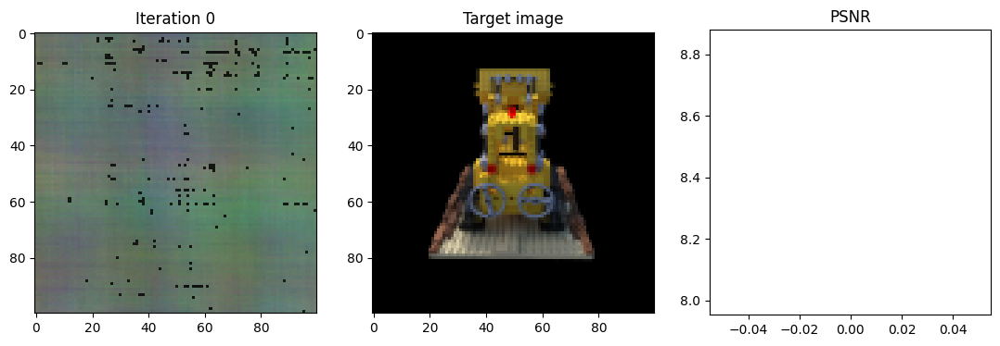

  1%|          | 25/3001 [00:39<1:10:40,  1.42s/it]

Iteration 25  Loss: 0.0664  PSNR: 11.78  Time: 1.58 secs per iter,  0.75 mins in total


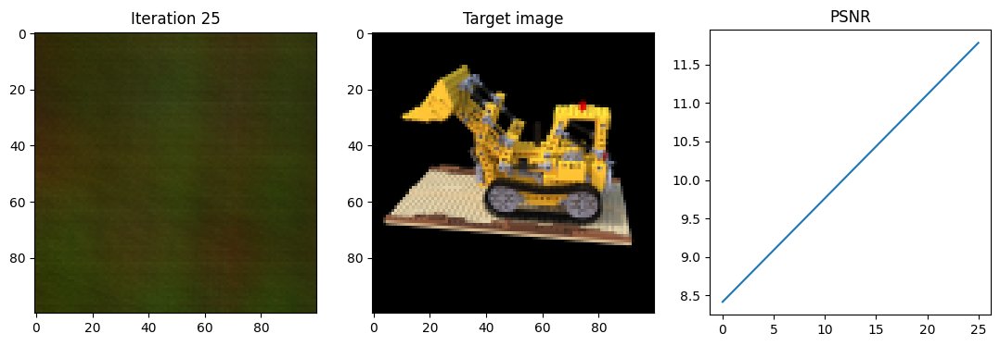

  2%|▏         | 50/3001 [01:18<1:11:24,  1.45s/it]

Iteration 50  Loss: 0.0464  PSNR: 13.34  Time: 1.54 secs per iter,  1.39 mins in total


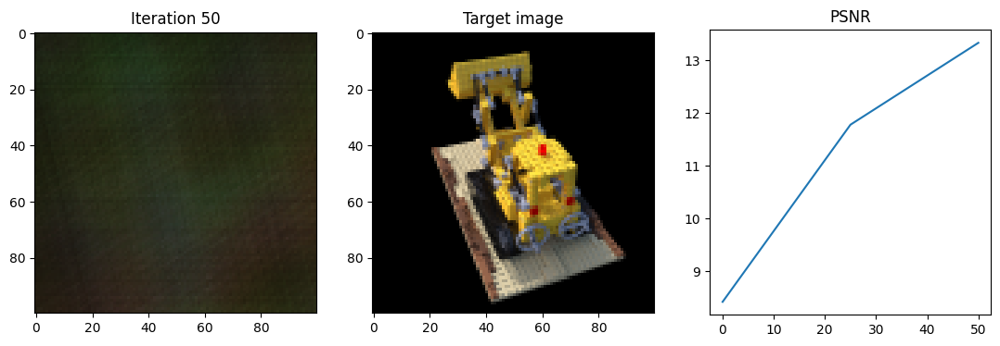

  2%|▏         | 75/3001 [01:57<1:10:30,  1.45s/it]

Iteration 75  Loss: 0.0201  PSNR: 16.96  Time: 1.55 secs per iter,  2.04 mins in total


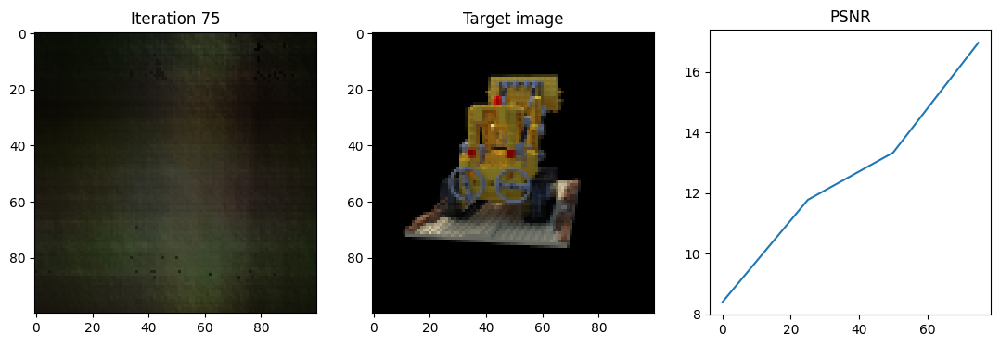

  3%|▎         | 100/3001 [02:36<1:11:22,  1.48s/it]

Iteration 100  Loss: 0.0171  PSNR: 17.66  Time: 1.57 secs per iter,  2.69 mins in total


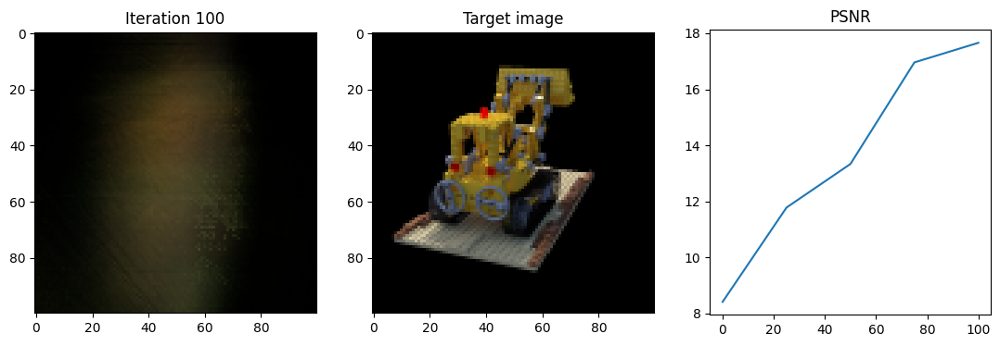

  4%|▍         | 125/3001 [03:14<1:09:59,  1.46s/it]

Iteration 125  Loss: 0.0141  PSNR: 18.52  Time: 1.54 secs per iter,  3.33 mins in total


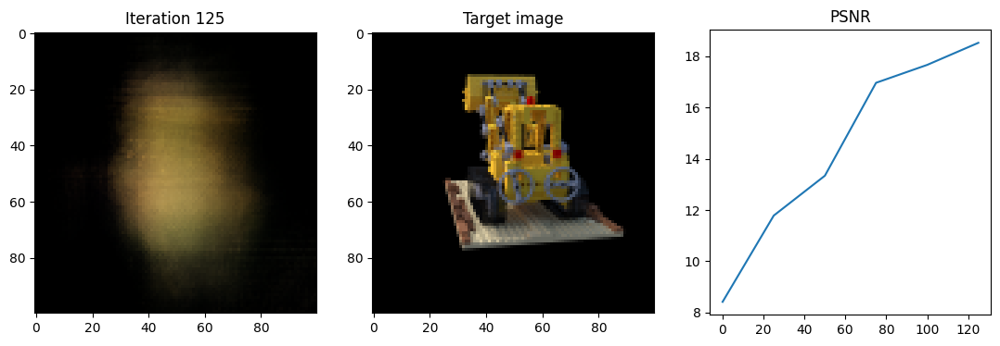

  5%|▍         | 150/3001 [03:53<1:10:13,  1.48s/it]

Iteration 150  Loss: 0.0175  PSNR: 17.57  Time: 1.55 secs per iter,  3.97 mins in total


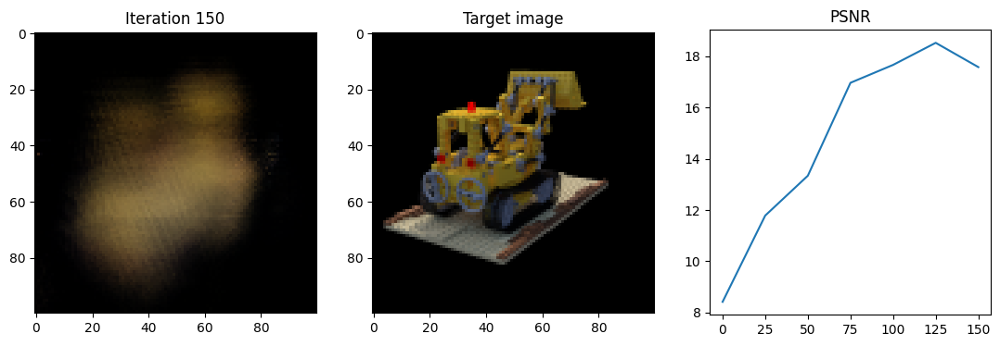

  6%|▌         | 175/3001 [04:31<1:11:24,  1.52s/it]

Iteration 175  Loss: 0.0322  PSNR: 14.92  Time: 1.54 secs per iter,  4.62 mins in total


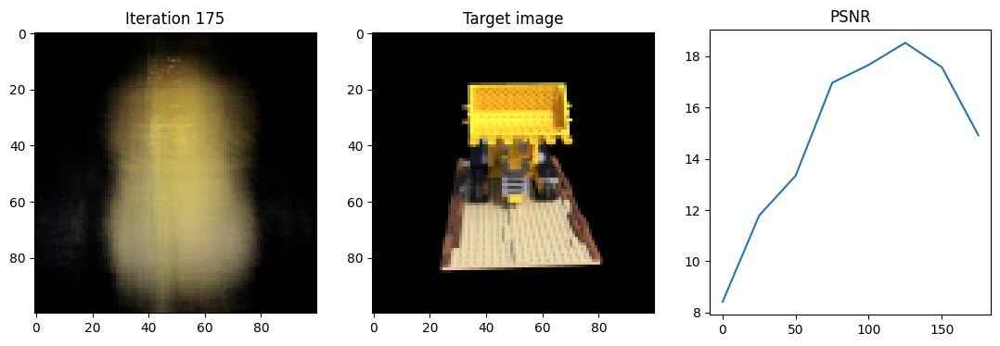

  7%|▋         | 200/3001 [05:10<1:11:25,  1.53s/it]

Iteration 200  Loss: 0.0185  PSNR: 17.33  Time: 1.54 secs per iter,  5.26 mins in total


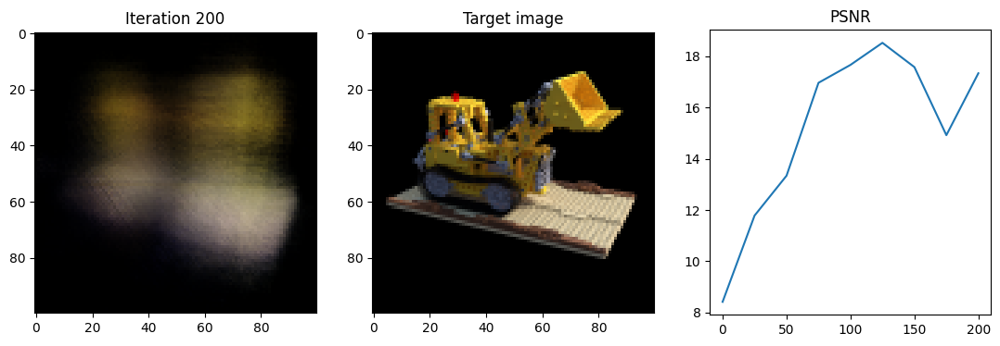

  7%|▋         | 225/3001 [05:48<1:06:12,  1.43s/it]

Iteration 225  Loss: 0.0168  PSNR: 17.75  Time: 1.54 secs per iter,  5.90 mins in total


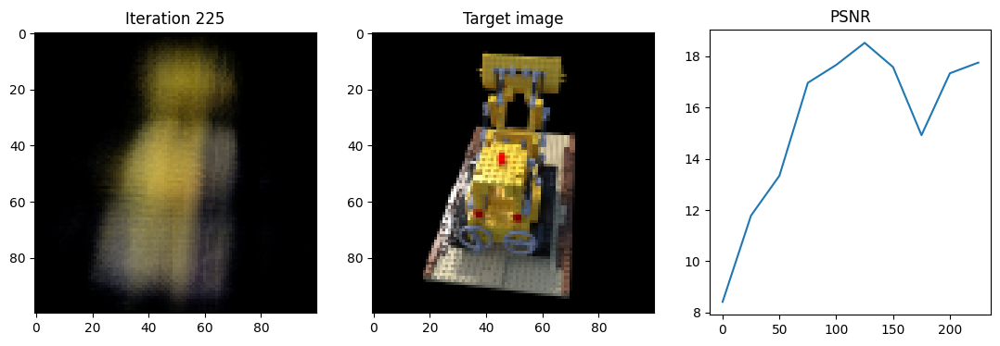

  8%|▊         | 250/3001 [06:26<1:05:35,  1.43s/it]

Iteration 250  Loss: 0.0165  PSNR: 17.82  Time: 1.52 secs per iter,  6.54 mins in total


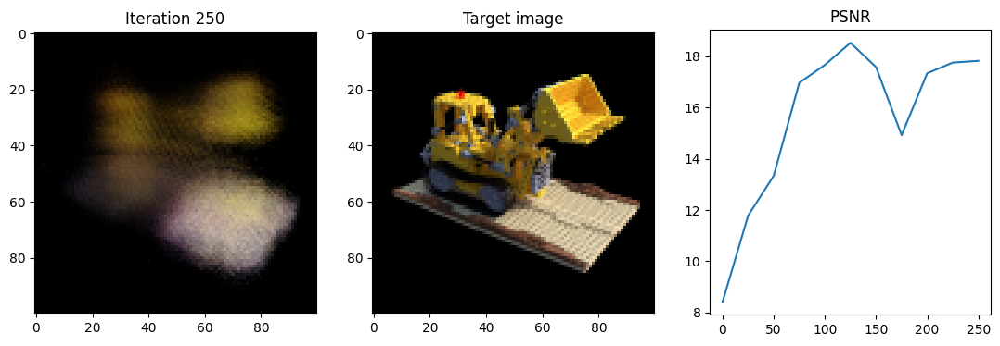

  9%|▉         | 275/3001 [07:05<1:04:27,  1.42s/it]

Iteration 275  Loss: 0.0200  PSNR: 16.98  Time: 1.53 secs per iter,  7.17 mins in total


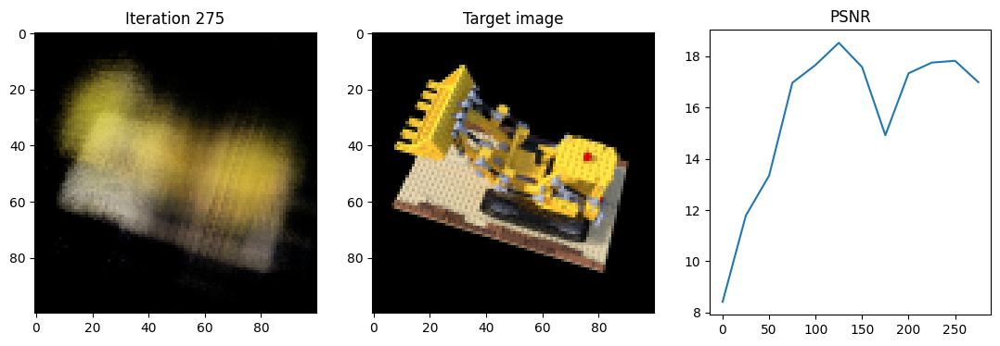

 10%|▉         | 300/3001 [07:43<1:05:15,  1.45s/it]

Iteration 300  Loss: 0.0149  PSNR: 18.28  Time: 1.53 secs per iter,  7.81 mins in total


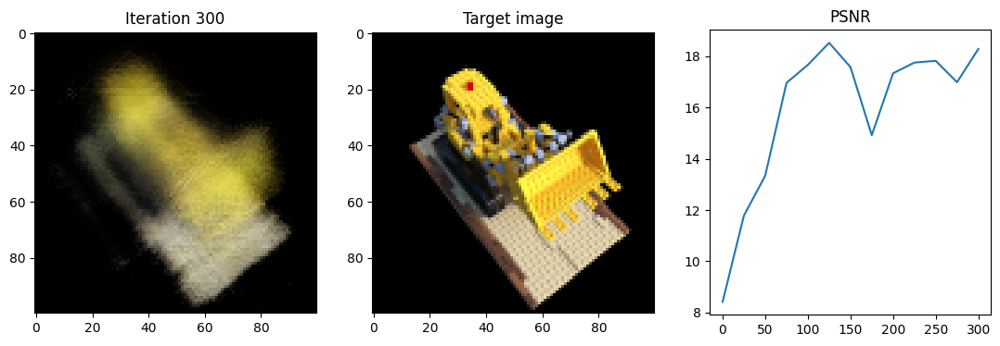

 11%|█         | 325/3001 [08:21<1:05:32,  1.47s/it]

Iteration 325  Loss: 0.0182  PSNR: 17.40  Time: 1.53 secs per iter,  8.45 mins in total


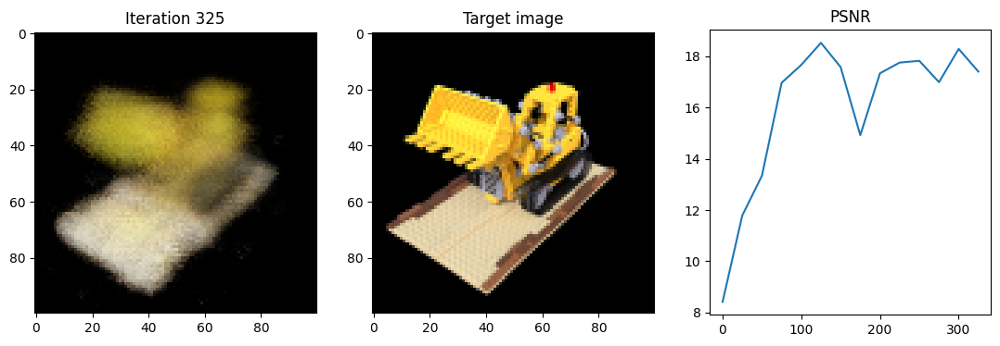

 12%|█▏        | 350/3001 [09:00<1:06:58,  1.52s/it]

Iteration 350  Loss: 0.0090  PSNR: 20.45  Time: 1.52 secs per iter,  9.08 mins in total


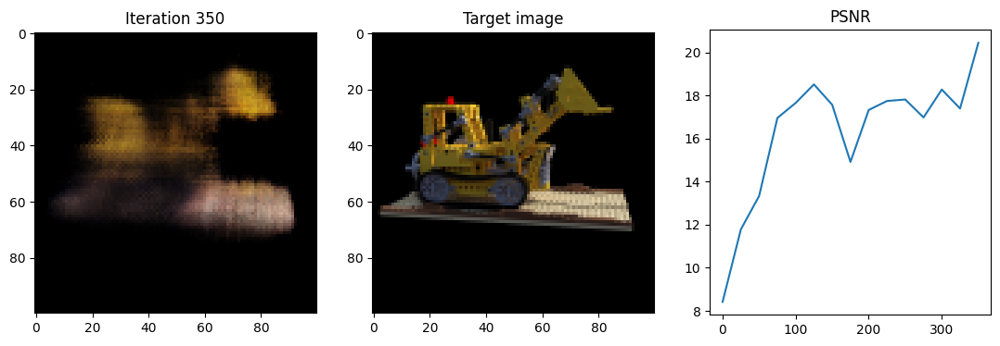

 12%|█▏        | 375/3001 [09:37<1:04:36,  1.48s/it]

Iteration 375  Loss: 0.0074  PSNR: 21.29  Time: 1.53 secs per iter,  9.72 mins in total


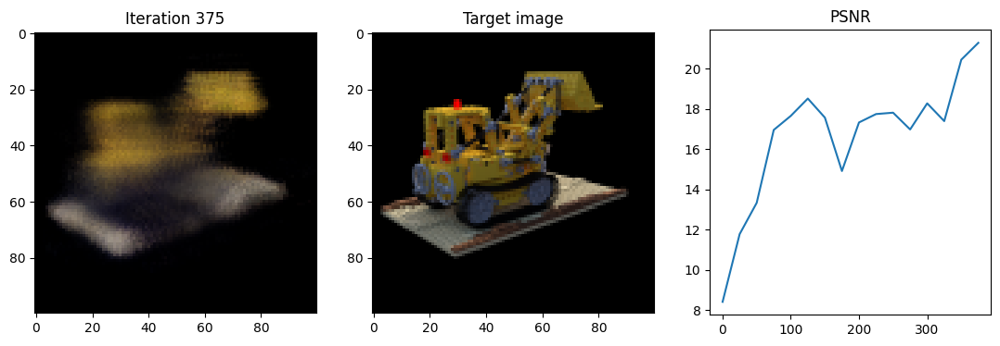

 13%|█▎        | 400/3001 [10:15<1:00:47,  1.40s/it]

Iteration 400  Loss: 0.0134  PSNR: 18.72  Time: 1.52 secs per iter,  10.35 mins in total


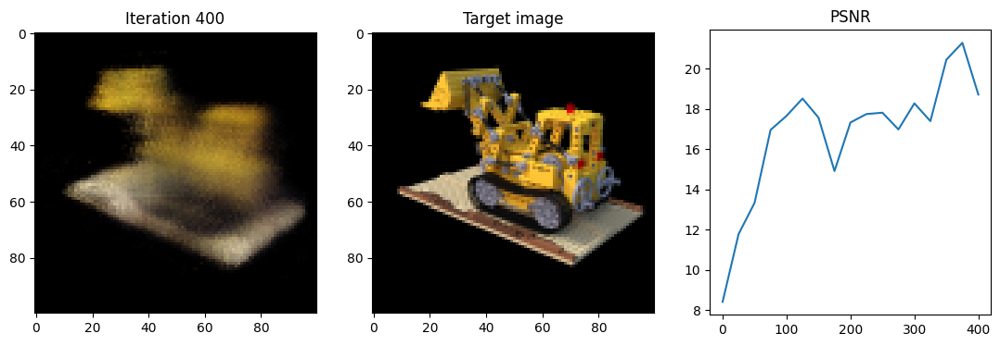

 14%|█▍        | 425/3001 [10:54<1:00:54,  1.42s/it]

Iteration 425  Loss: 0.0092  PSNR: 20.38  Time: 1.52 secs per iter,  10.99 mins in total


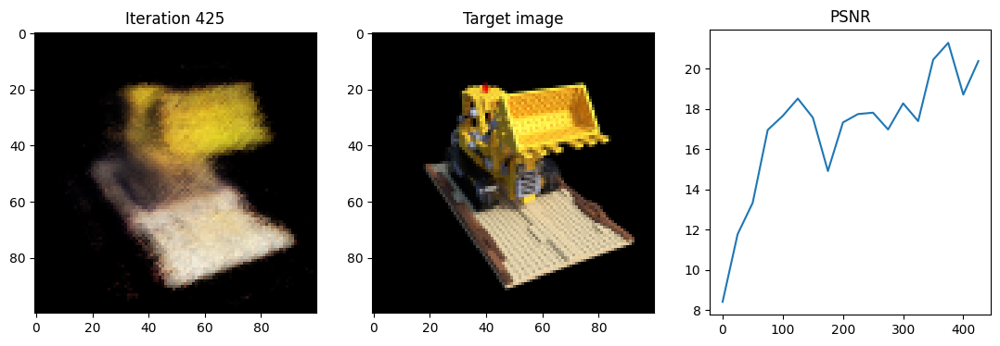

 15%|█▍        | 450/3001 [11:32<1:00:31,  1.42s/it]

Iteration 450  Loss: 0.0077  PSNR: 21.16  Time: 1.53 secs per iter,  11.62 mins in total


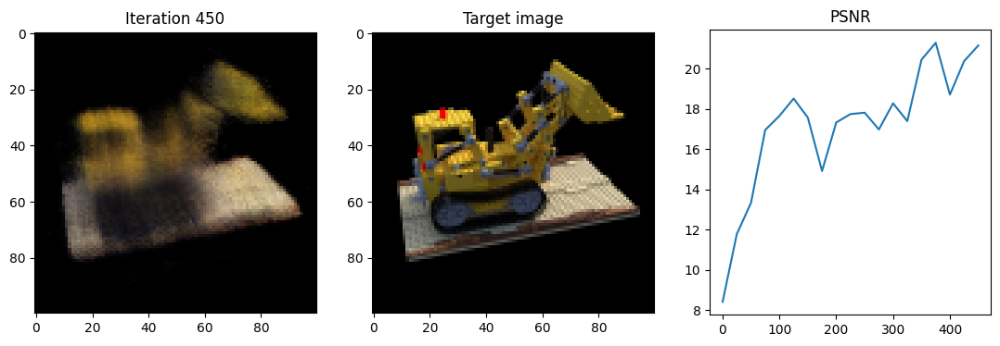

 16%|█▌        | 475/3001 [12:10<1:01:55,  1.47s/it]

Iteration 475  Loss: 0.0087  PSNR: 20.59  Time: 1.53 secs per iter,  12.26 mins in total


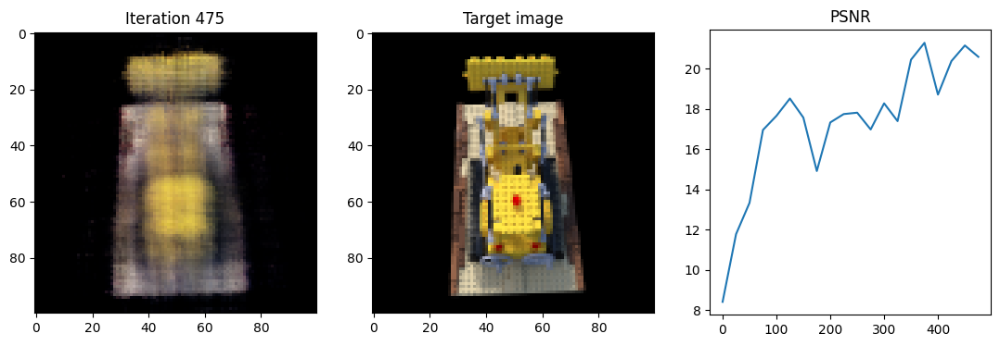

 17%|█▋        | 500/3001 [12:48<1:02:02,  1.49s/it]

Iteration 500  Loss: 0.0092  PSNR: 20.35  Time: 1.52 secs per iter,  12.89 mins in total


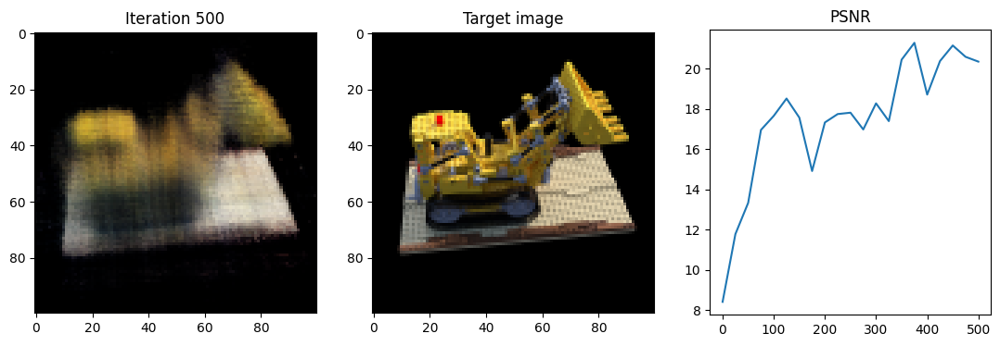

 17%|█▋        | 525/3001 [13:26<1:01:05,  1.48s/it]

Iteration 525  Loss: 0.0102  PSNR: 19.93  Time: 1.53 secs per iter,  13.53 mins in total


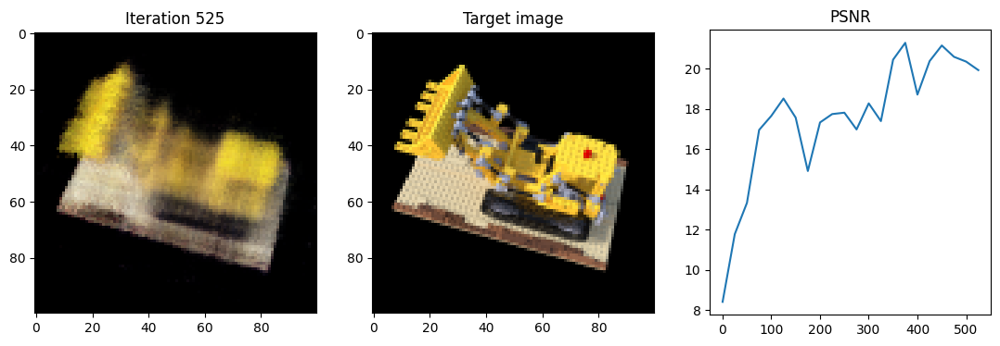

 18%|█▊        | 550/3001 [14:03<57:02,  1.40s/it]

Iteration 550  Loss: 0.0073  PSNR: 21.34  Time: 1.51 secs per iter,  14.16 mins in total


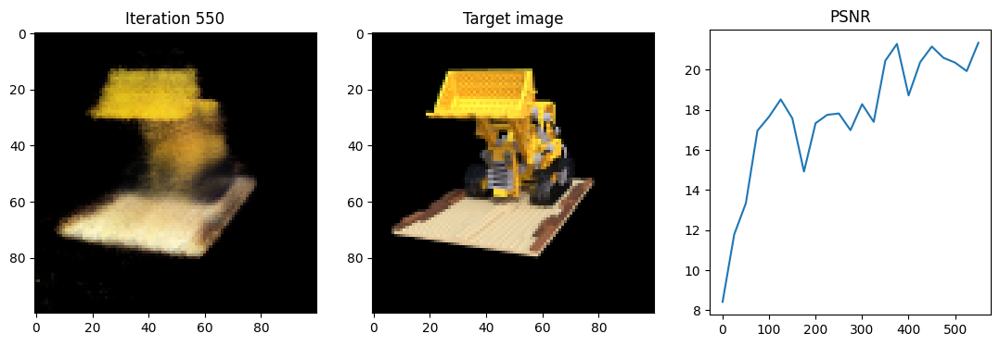

 19%|█▉        | 575/3001 [14:42<57:27,  1.42s/it]

Iteration 575  Loss: 0.0108  PSNR: 19.67  Time: 1.52 secs per iter,  14.79 mins in total


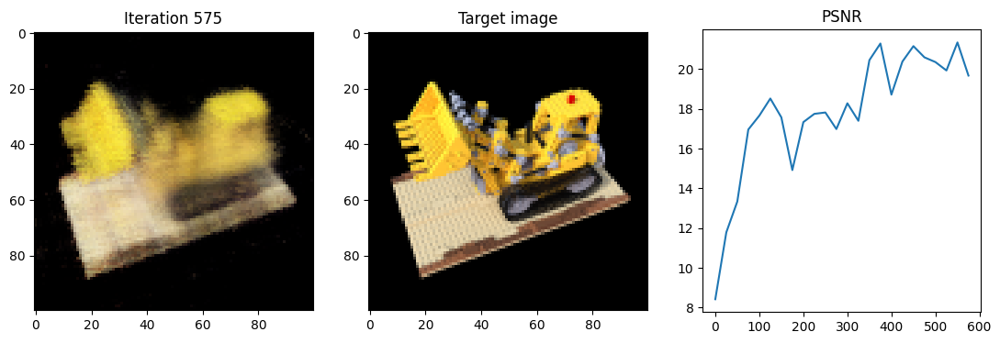

 20%|█▉        | 600/3001 [15:20<56:42,  1.42s/it]

Iteration 600  Loss: 0.0108  PSNR: 19.65  Time: 1.52 secs per iter,  15.42 mins in total


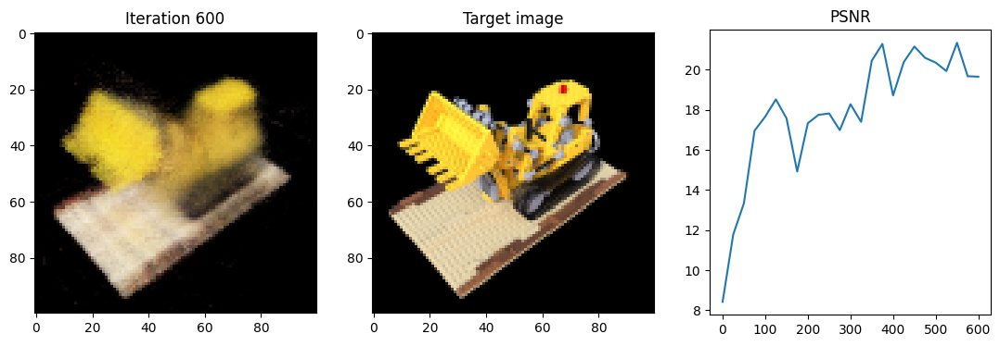

 21%|██        | 625/3001 [15:58<57:48,  1.46s/it]

Iteration 625  Loss: 0.0085  PSNR: 20.70  Time: 1.52 secs per iter,  16.06 mins in total


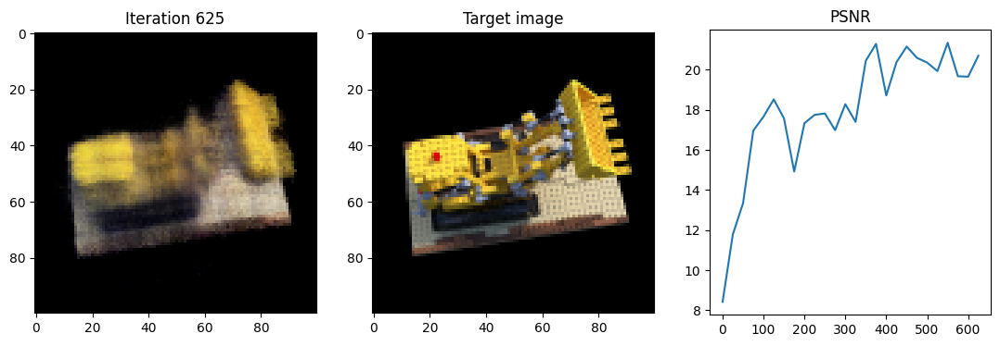

 22%|██▏       | 650/3001 [16:36<59:39,  1.52s/it]

Iteration 650  Loss: 0.0086  PSNR: 20.66  Time: 1.52 secs per iter,  16.69 mins in total


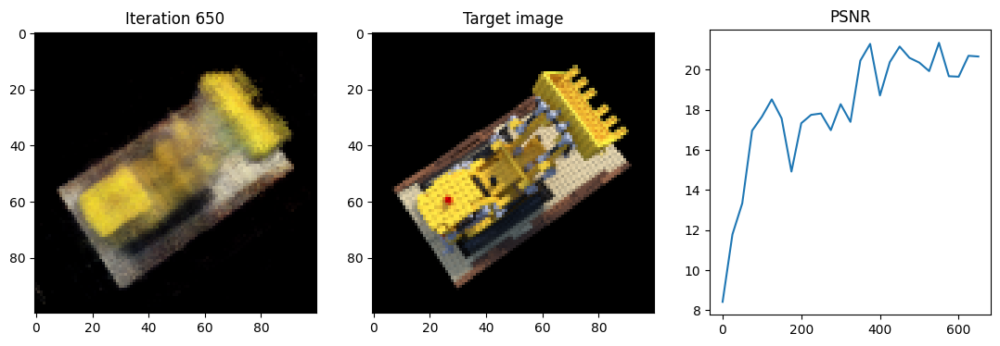

 22%|██▏       | 675/3001 [17:14<57:47,  1.49s/it]

Iteration 675  Loss: 0.0042  PSNR: 23.80  Time: 1.52 secs per iter,  17.32 mins in total


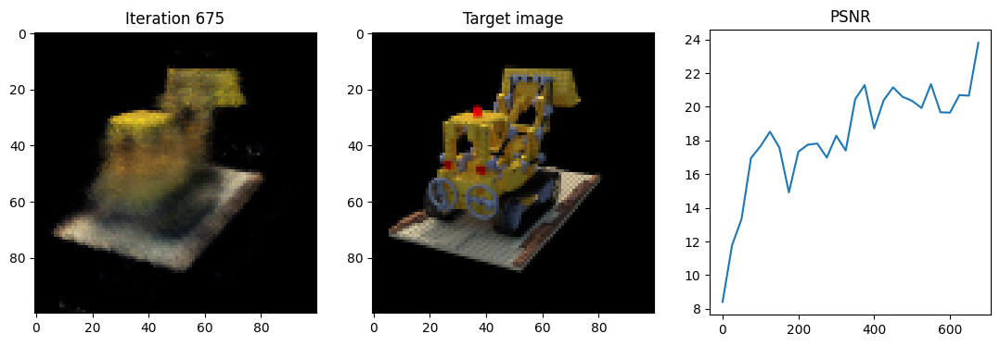

 23%|██▎       | 700/3001 [17:52<54:40,  1.43s/it]

Iteration 700  Loss: 0.0075  PSNR: 21.22  Time: 1.55 secs per iter,  17.97 mins in total


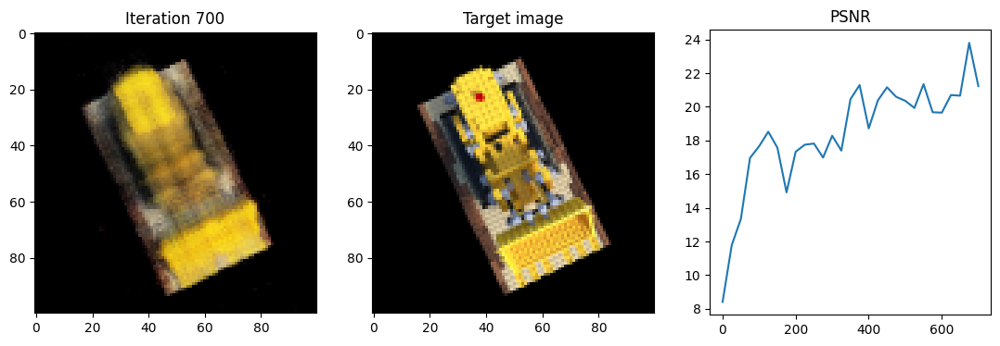

 24%|██▍       | 725/3001 [18:31<53:44,  1.42s/it]

Iteration 725  Loss: 0.0043  PSNR: 23.65  Time: 1.53 secs per iter,  18.60 mins in total


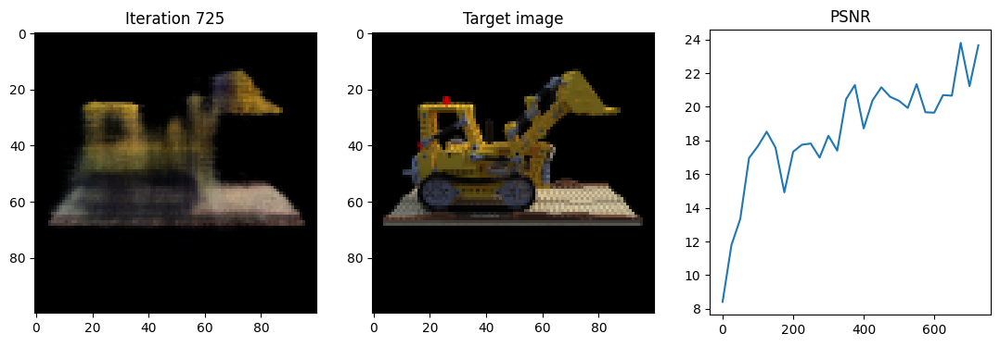

 25%|██▍       | 750/3001 [19:09<53:34,  1.43s/it]

Iteration 750  Loss: 0.0069  PSNR: 21.60  Time: 1.53 secs per iter,  19.24 mins in total


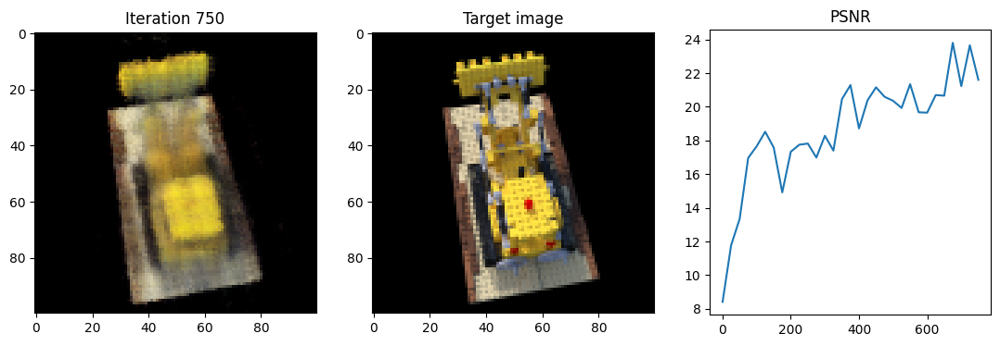

 26%|██▌       | 775/3001 [19:47<54:30,  1.47s/it]

Iteration 775  Loss: 0.0071  PSNR: 21.50  Time: 1.53 secs per iter,  19.88 mins in total


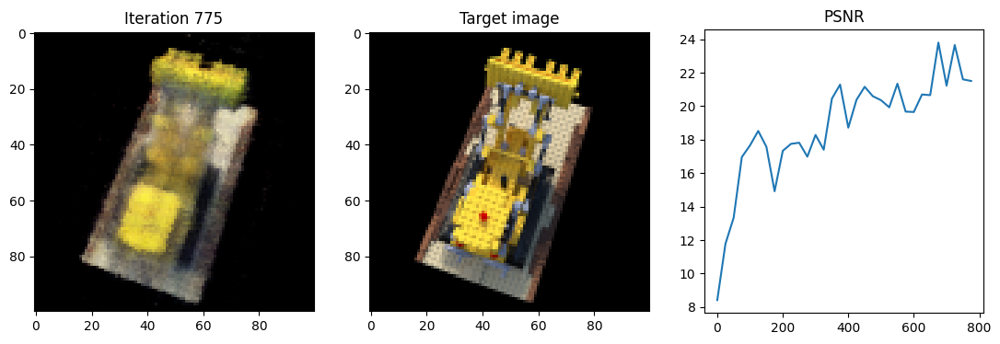

 27%|██▋       | 800/3001 [20:26<54:39,  1.49s/it]

Iteration 800  Loss: 0.0043  PSNR: 23.64  Time: 1.53 secs per iter,  20.52 mins in total


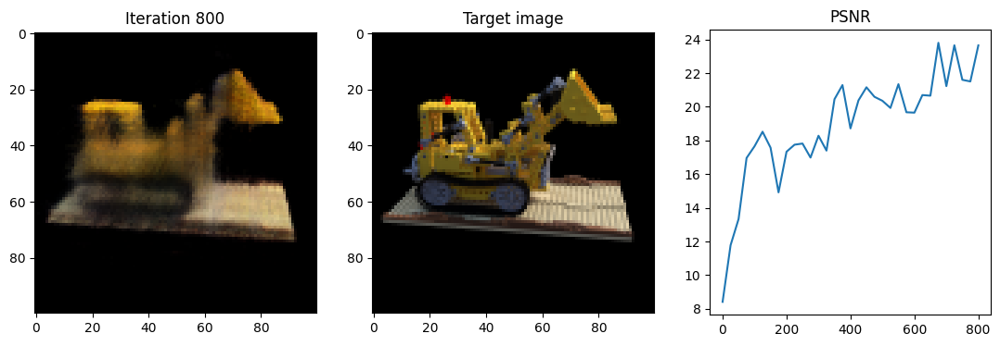

 27%|██▋       | 825/3001 [21:04<53:56,  1.49s/it]

Iteration 825  Loss: 0.0074  PSNR: 21.30  Time: 1.53 secs per iter,  21.16 mins in total


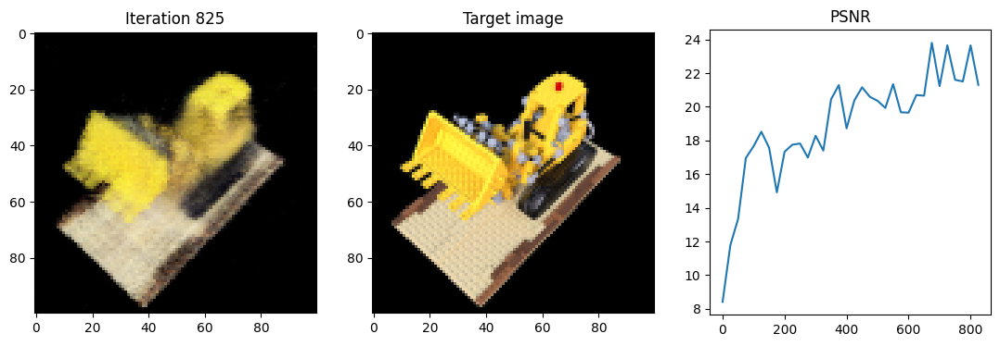

 28%|██▊       | 850/3001 [21:42<50:33,  1.41s/it]

Iteration 850  Loss: 0.0063  PSNR: 21.99  Time: 1.52 secs per iter,  21.79 mins in total


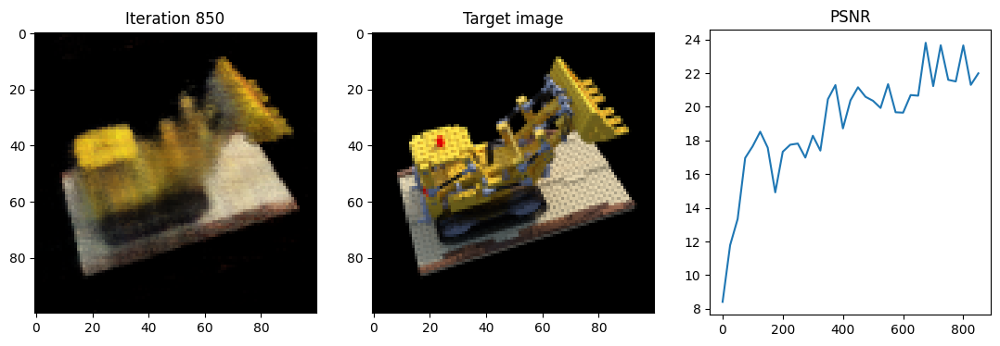

 29%|██▉       | 875/3001 [22:20<49:55,  1.41s/it]

Iteration 875  Loss: 0.0050  PSNR: 23.04  Time: 1.51 secs per iter,  22.42 mins in total


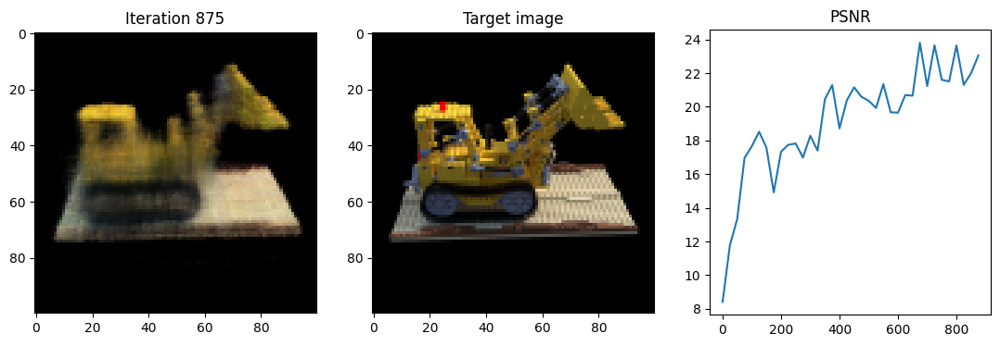

 30%|██▉       | 900/3001 [22:58<49:52,  1.42s/it]

Iteration 900  Loss: 0.0045  PSNR: 23.43  Time: 1.54 secs per iter,  23.06 mins in total


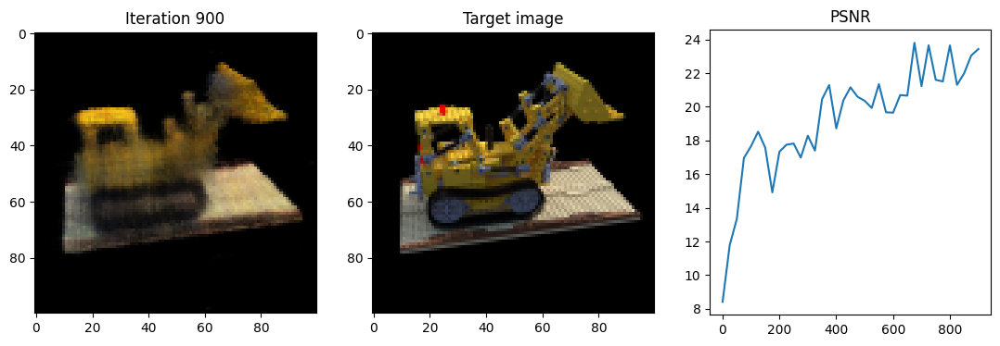

 31%|███       | 925/3001 [23:36<50:56,  1.47s/it]

Iteration 925  Loss: 0.0049  PSNR: 23.12  Time: 1.52 secs per iter,  23.69 mins in total


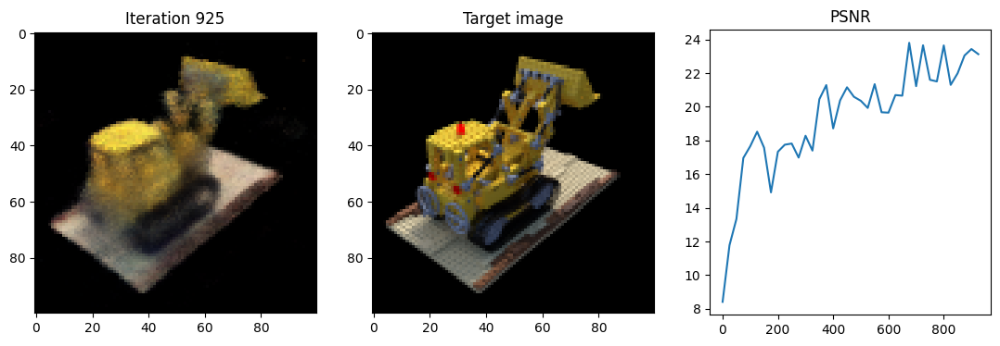

 32%|███▏      | 950/3001 [24:14<50:47,  1.49s/it]

Iteration 950  Loss: 0.0074  PSNR: 21.31  Time: 1.53 secs per iter,  24.33 mins in total


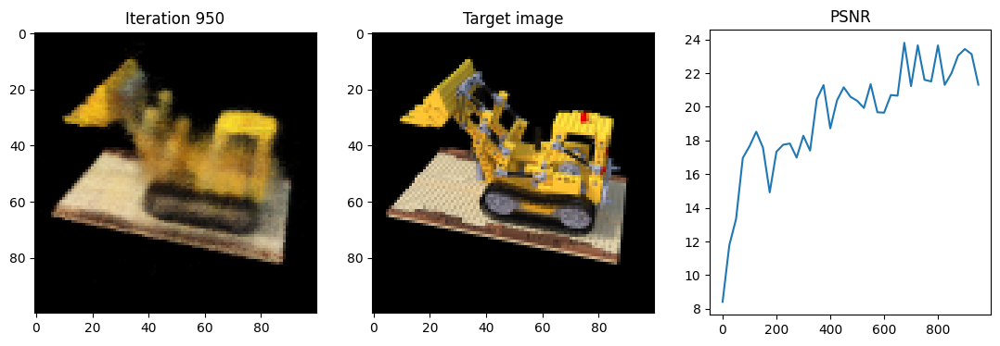

 32%|███▏      | 975/3001 [24:53<51:25,  1.52s/it]

Iteration 975  Loss: 0.0054  PSNR: 22.70  Time: 1.54 secs per iter,  24.97 mins in total


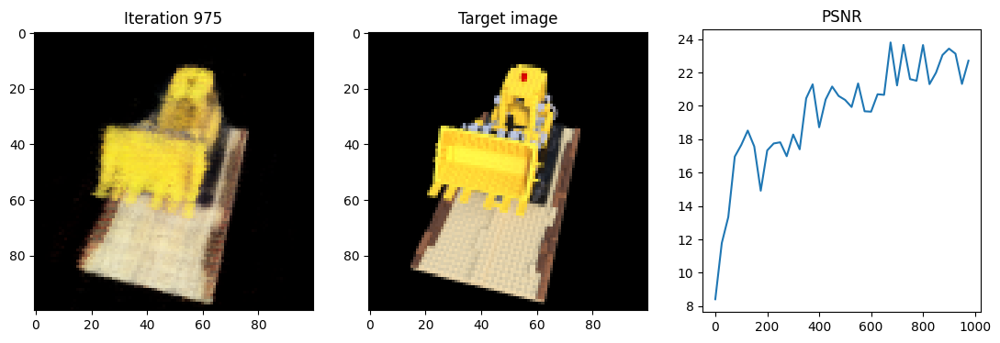

 33%|███▎      | 1000/3001 [25:31<48:33,  1.46s/it]

Iteration 1000  Loss: 0.0040  PSNR: 23.98  Time: 1.56 secs per iter,  25.62 mins in total


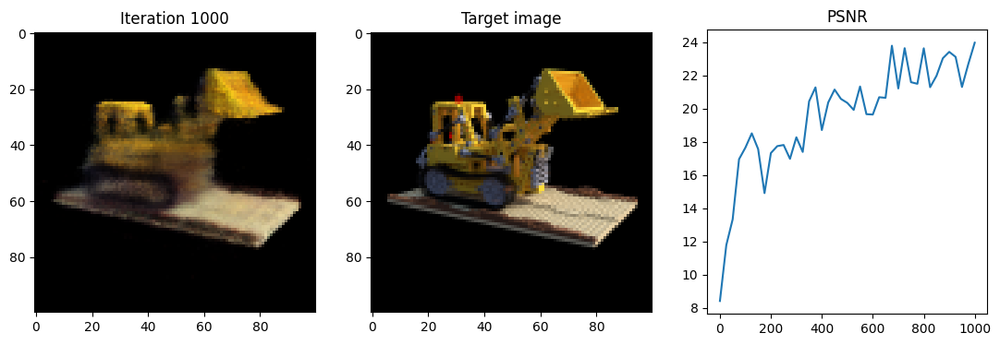

 34%|███▍      | 1025/3001 [26:10<46:26,  1.41s/it]

Iteration 1025  Loss: 0.0041  PSNR: 23.85  Time: 1.51 secs per iter,  26.25 mins in total


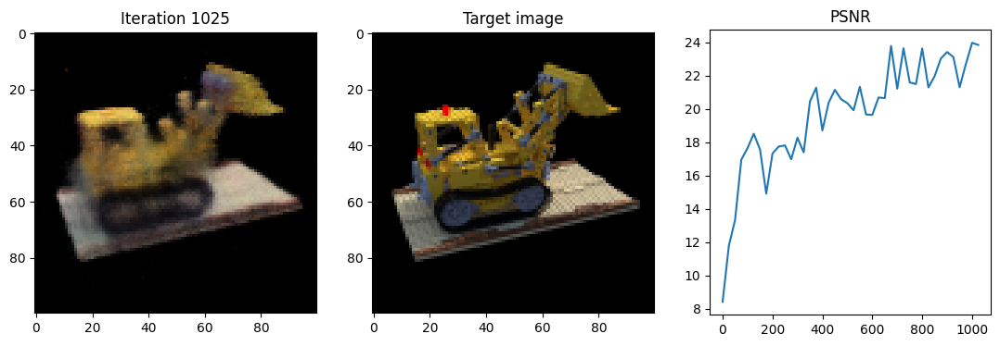

 35%|███▍      | 1050/3001 [26:48<46:27,  1.43s/it]

Iteration 1050  Loss: 0.0033  PSNR: 24.79  Time: 1.53 secs per iter,  26.89 mins in total


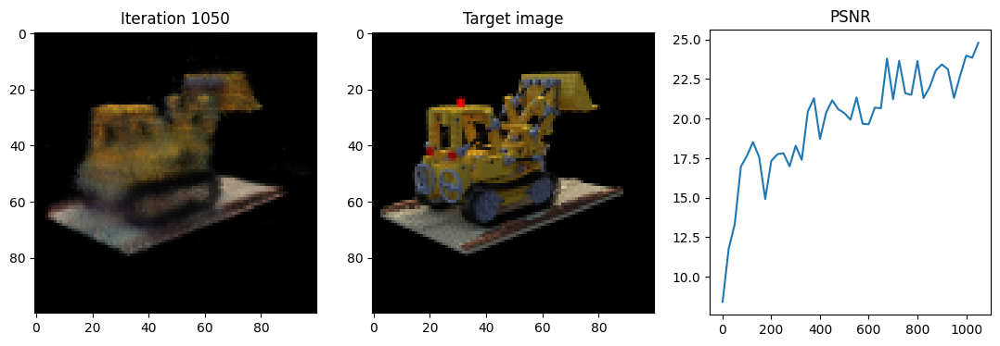

 36%|███▌      | 1075/3001 [27:26<46:44,  1.46s/it]

Iteration 1075  Loss: 0.0033  PSNR: 24.78  Time: 1.52 secs per iter,  27.52 mins in total


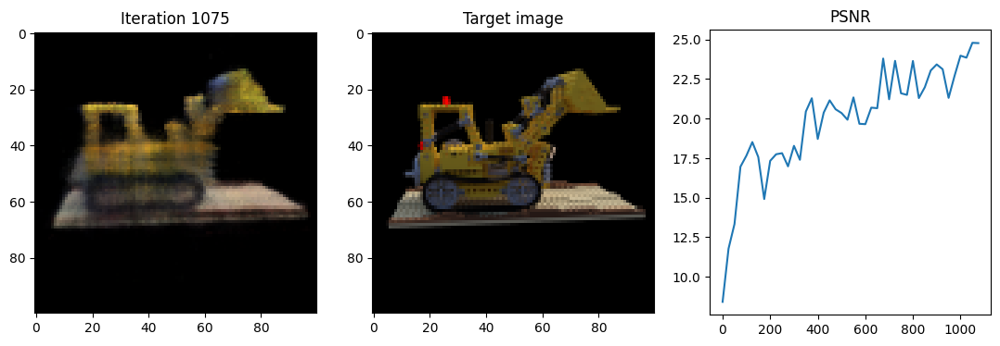

 37%|███▋      | 1100/3001 [28:04<49:01,  1.55s/it]

Iteration 1100  Loss: 0.0056  PSNR: 22.54  Time: 1.53 secs per iter,  28.16 mins in total


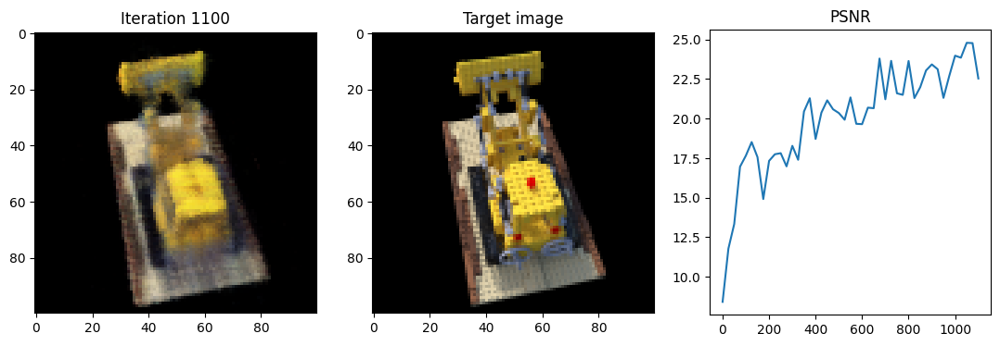

 37%|███▋      | 1125/3001 [28:42<46:24,  1.48s/it]

Iteration 1125  Loss: 0.0054  PSNR: 22.64  Time: 1.53 secs per iter,  28.80 mins in total


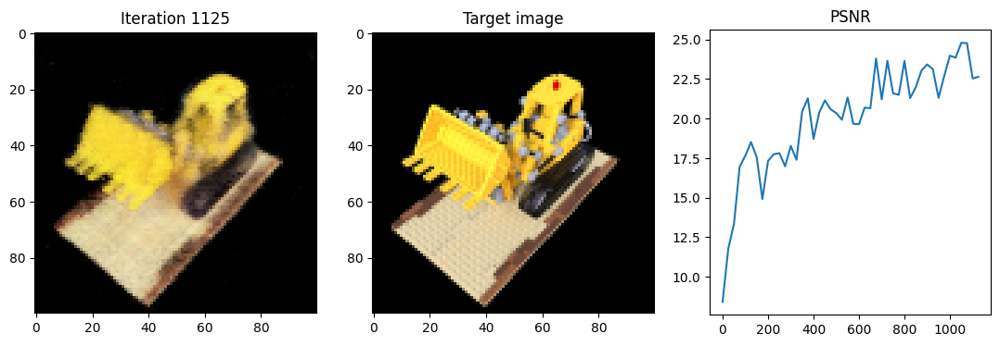

 38%|███▊      | 1150/3001 [29:20<43:30,  1.41s/it]

Iteration 1150  Loss: 0.0053  PSNR: 22.72  Time: 1.52 secs per iter,  29.43 mins in total


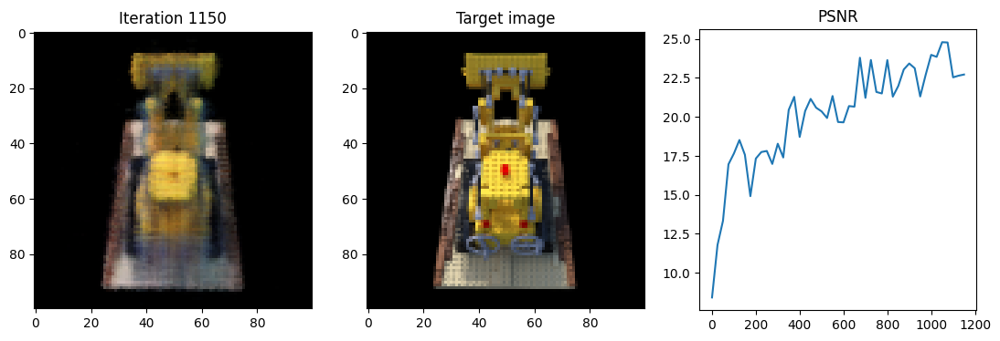

 39%|███▉      | 1175/3001 [29:58<42:58,  1.41s/it]

Iteration 1175  Loss: 0.0054  PSNR: 22.69  Time: 1.52 secs per iter,  30.06 mins in total


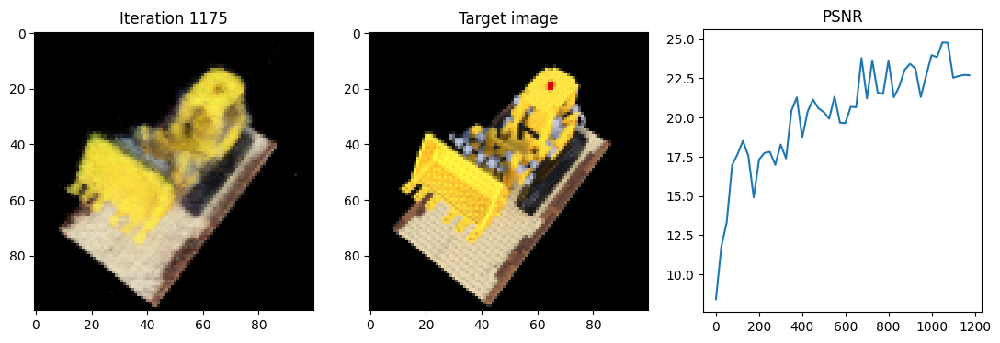

 40%|███▉      | 1200/3001 [30:37<43:41,  1.46s/it]

Iteration 1200  Loss: 0.0061  PSNR: 22.12  Time: 1.53 secs per iter,  30.70 mins in total


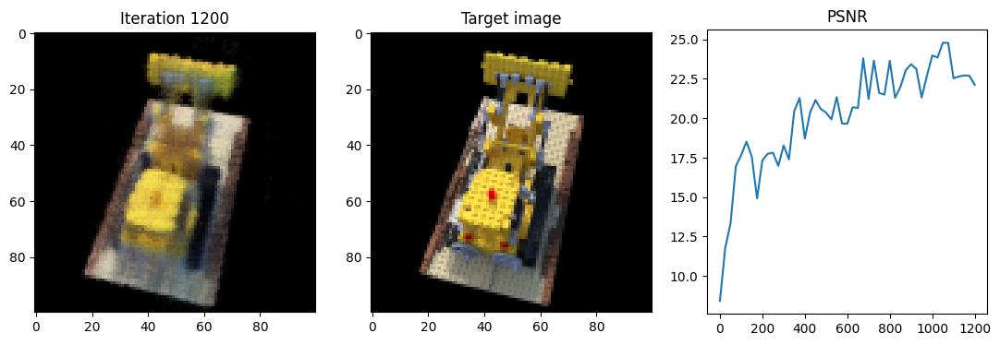

 41%|████      | 1225/3001 [31:15<44:28,  1.50s/it]

Iteration 1225  Loss: 0.0050  PSNR: 22.98  Time: 1.53 secs per iter,  31.34 mins in total


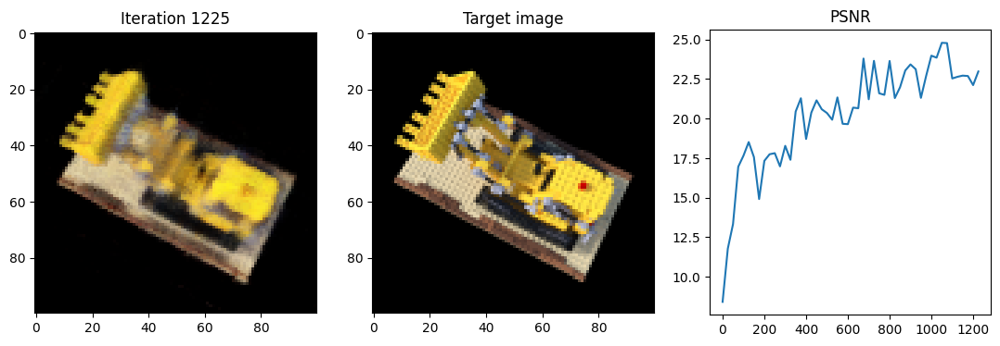

 42%|████▏     | 1250/3001 [31:53<44:32,  1.53s/it]

Iteration 1250  Loss: 0.0053  PSNR: 22.77  Time: 1.52 secs per iter,  31.97 mins in total


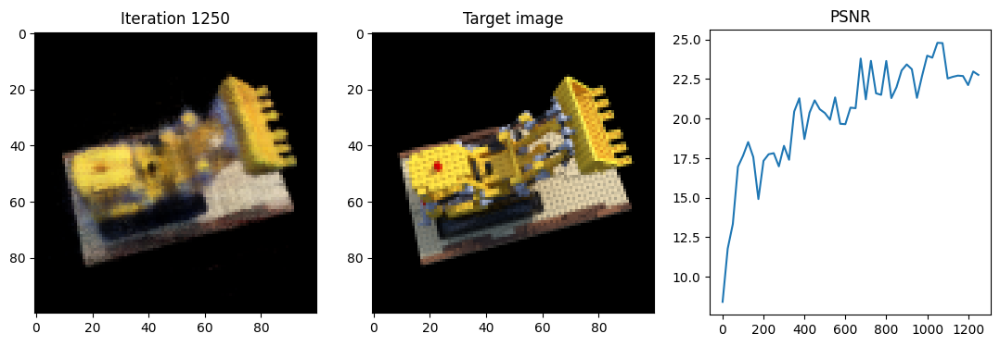

 42%|████▏     | 1275/3001 [32:30<40:13,  1.40s/it]

Iteration 1275  Loss: 0.0055  PSNR: 22.61  Time: 1.52 secs per iter,  32.61 mins in total


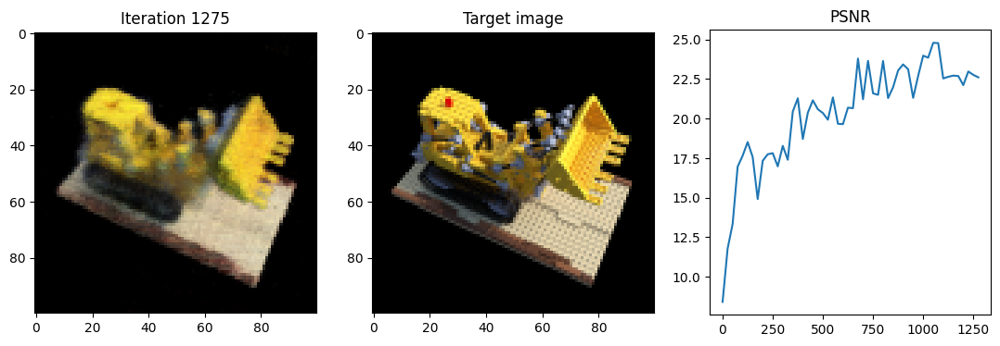

 43%|████▎     | 1300/3001 [33:08<40:02,  1.41s/it]

Iteration 1300  Loss: 0.0050  PSNR: 23.00  Time: 1.51 secs per iter,  33.23 mins in total


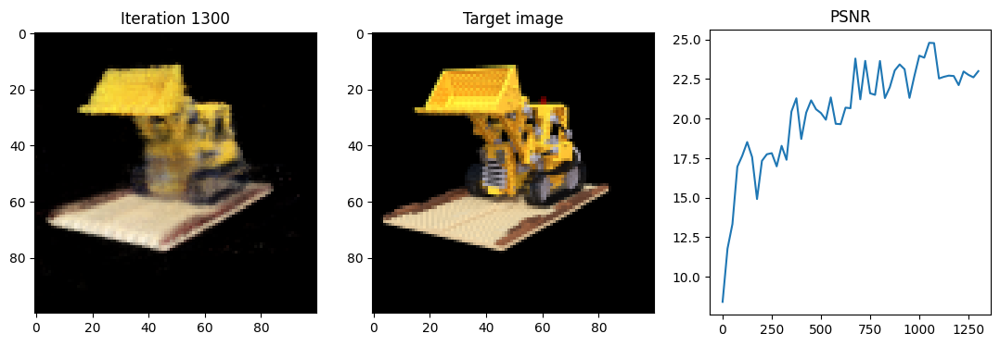

 44%|████▍     | 1325/3001 [33:47<39:57,  1.43s/it]

Iteration 1325  Loss: 0.0031  PSNR: 25.12  Time: 1.54 secs per iter,  33.87 mins in total


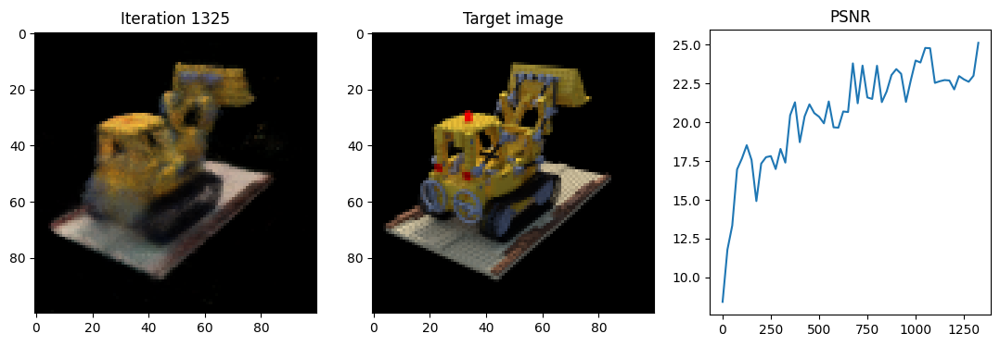

 45%|████▍     | 1350/3001 [34:25<40:18,  1.46s/it]

Iteration 1350  Loss: 0.0047  PSNR: 23.29  Time: 1.52 secs per iter,  34.51 mins in total


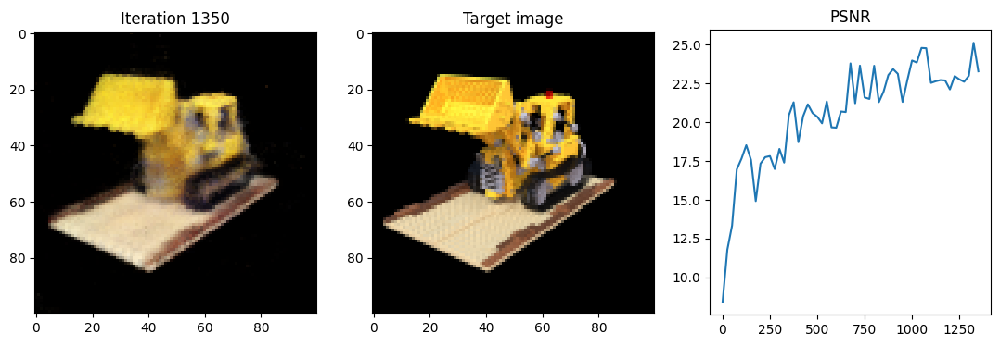

 46%|████▌     | 1375/3001 [35:03<41:03,  1.51s/it]

Iteration 1375  Loss: 0.0049  PSNR: 23.13  Time: 1.52 secs per iter,  35.14 mins in total


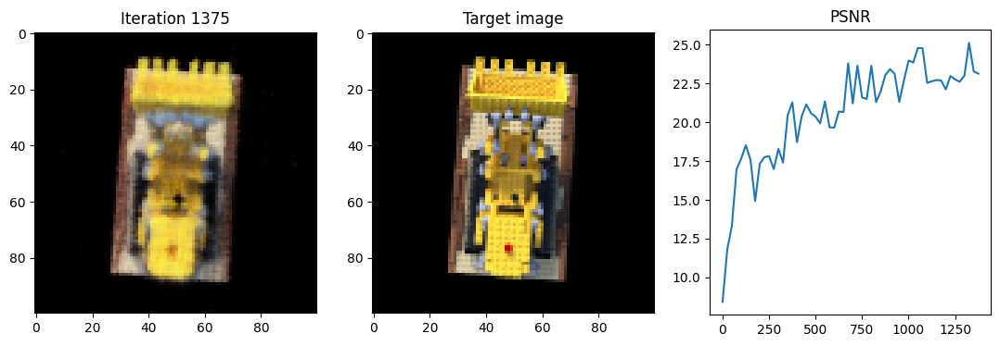

 47%|████▋     | 1400/3001 [35:41<39:20,  1.47s/it]

Iteration 1400  Loss: 0.0045  PSNR: 23.42  Time: 1.52 secs per iter,  35.78 mins in total


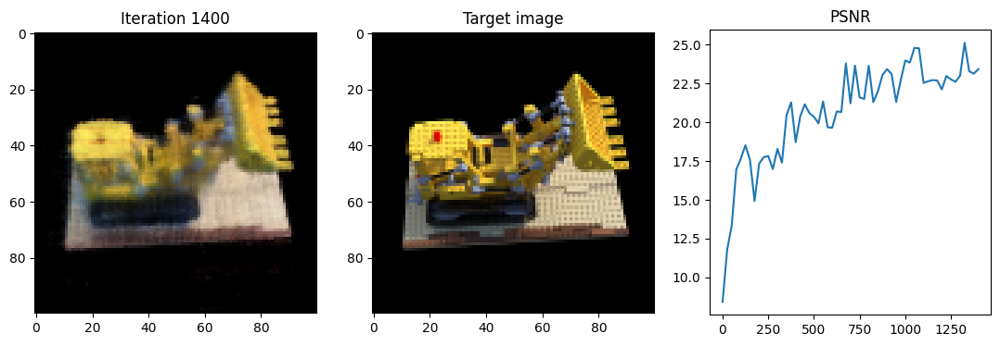

 47%|████▋     | 1425/3001 [36:19<37:06,  1.41s/it]

Iteration 1425  Loss: 0.0044  PSNR: 23.55  Time: 1.52 secs per iter,  36.41 mins in total


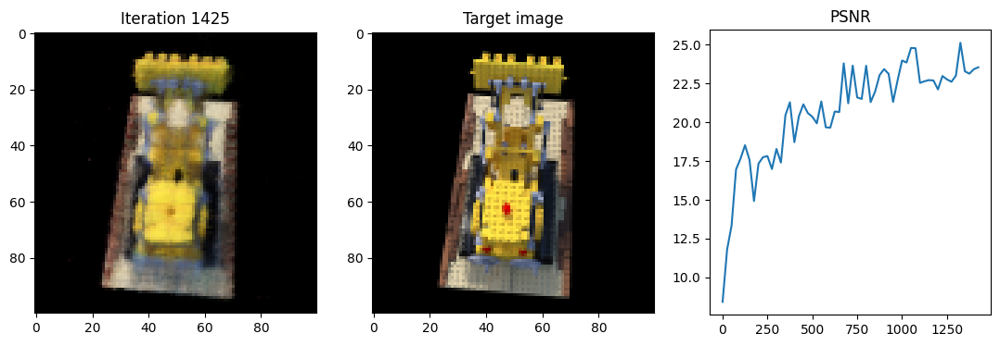

 48%|████▊     | 1450/3001 [36:57<36:50,  1.43s/it]

Iteration 1450  Loss: 0.0022  PSNR: 26.50  Time: 1.52 secs per iter,  37.04 mins in total


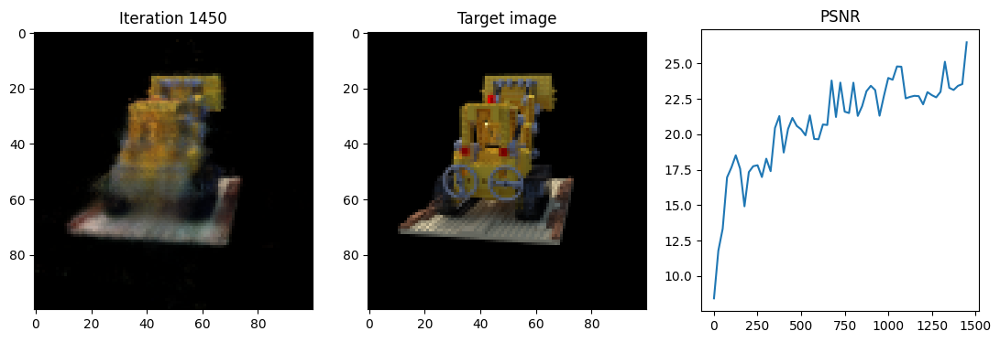

 49%|████▉     | 1475/3001 [37:35<36:53,  1.45s/it]

Iteration 1475  Loss: 0.0038  PSNR: 24.21  Time: 1.53 secs per iter,  37.68 mins in total


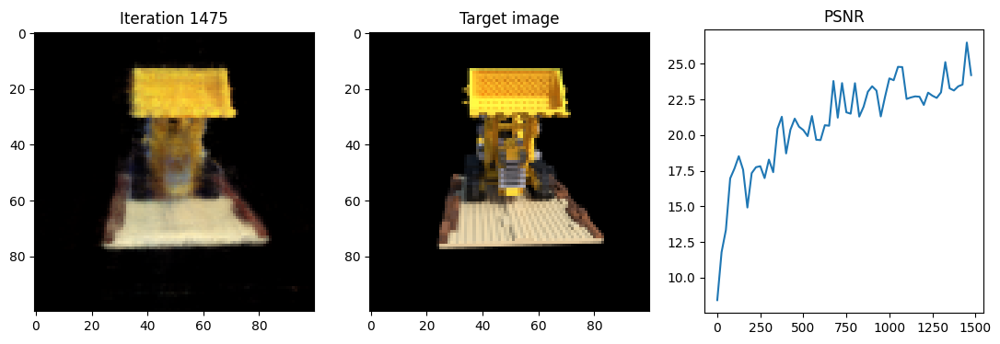

 50%|████▉     | 1500/3001 [38:14<37:27,  1.50s/it]

Iteration 1500  Loss: 0.0053  PSNR: 22.74  Time: 1.54 secs per iter,  38.32 mins in total


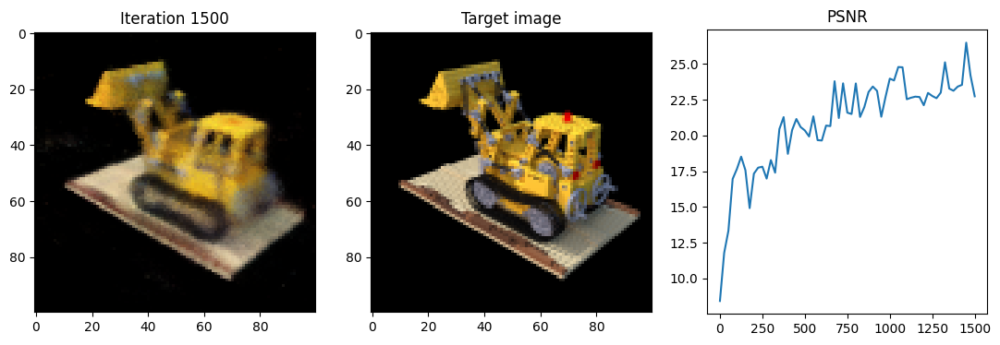

 51%|█████     | 1525/3001 [38:52<37:37,  1.53s/it]

Iteration 1525  Loss: 0.0031  PSNR: 25.08  Time: 1.53 secs per iter,  38.96 mins in total


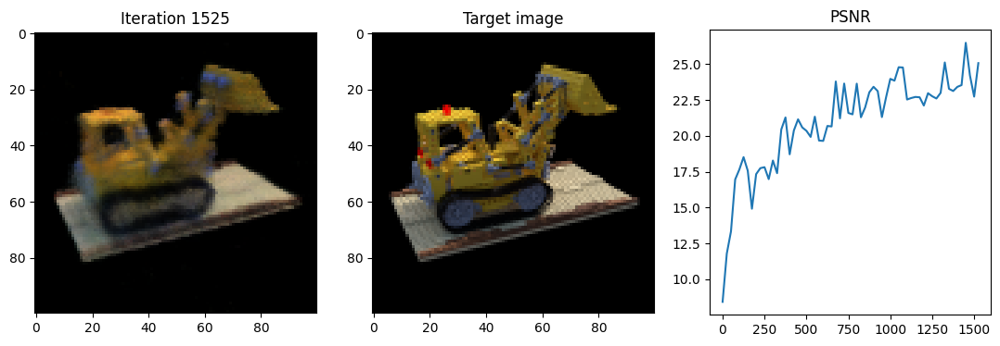

 52%|█████▏    | 1550/3001 [39:30<34:20,  1.42s/it]

Iteration 1550  Loss: 0.0036  PSNR: 24.41  Time: 1.53 secs per iter,  39.60 mins in total


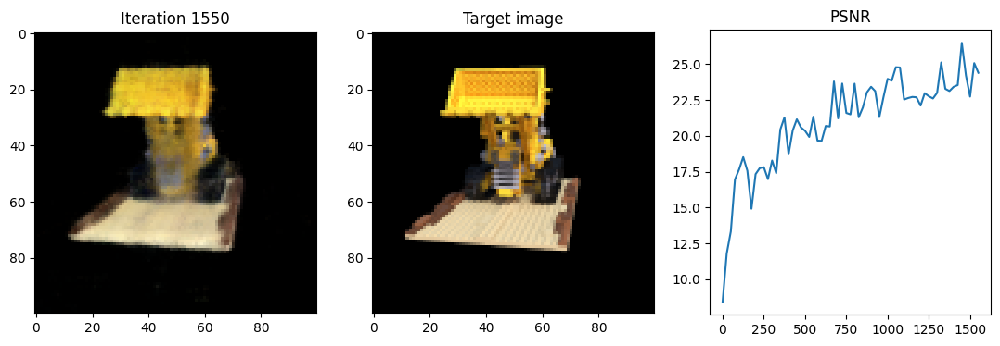

 52%|█████▏    | 1575/3001 [40:08<33:24,  1.41s/it]

Iteration 1575  Loss: 0.0035  PSNR: 24.58  Time: 1.51 secs per iter,  40.23 mins in total


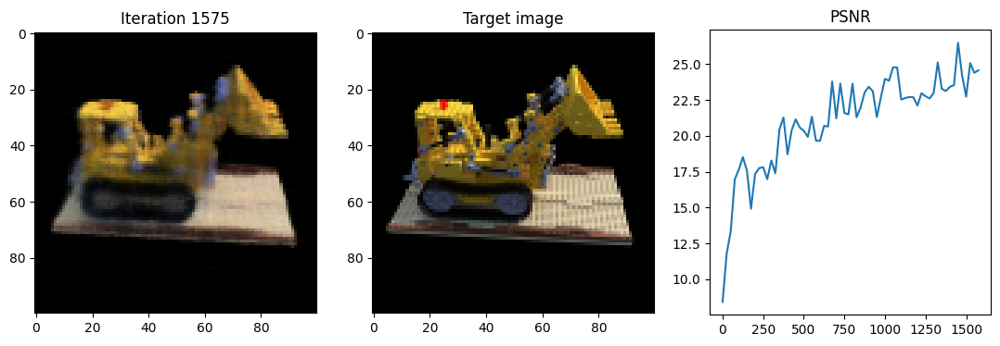

 53%|█████▎    | 1600/3001 [40:46<33:24,  1.43s/it]

Iteration 1600  Loss: 0.0035  PSNR: 24.53  Time: 1.53 secs per iter,  40.87 mins in total


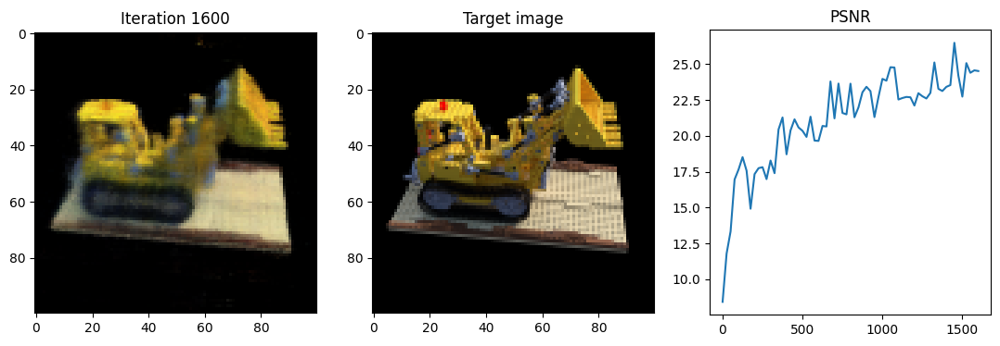

 54%|█████▍    | 1625/3001 [41:25<33:31,  1.46s/it]

Iteration 1625  Loss: 0.0021  PSNR: 26.68  Time: 1.53 secs per iter,  41.50 mins in total


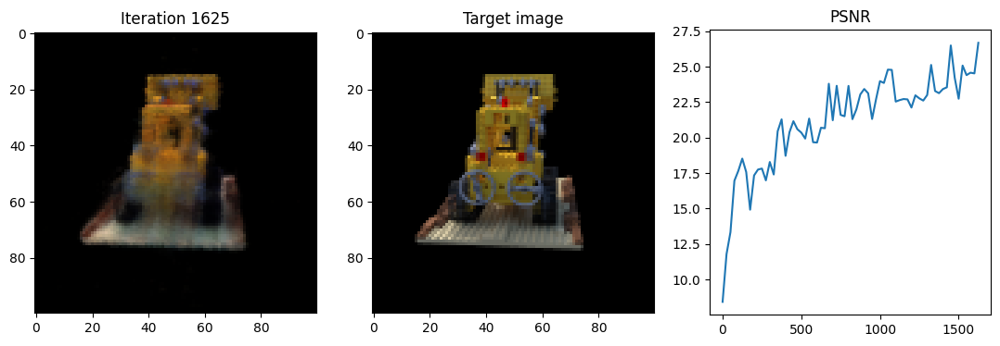

 55%|█████▍    | 1650/3001 [42:03<33:21,  1.48s/it]

Iteration 1650  Loss: 0.0041  PSNR: 23.82  Time: 1.54 secs per iter,  42.14 mins in total


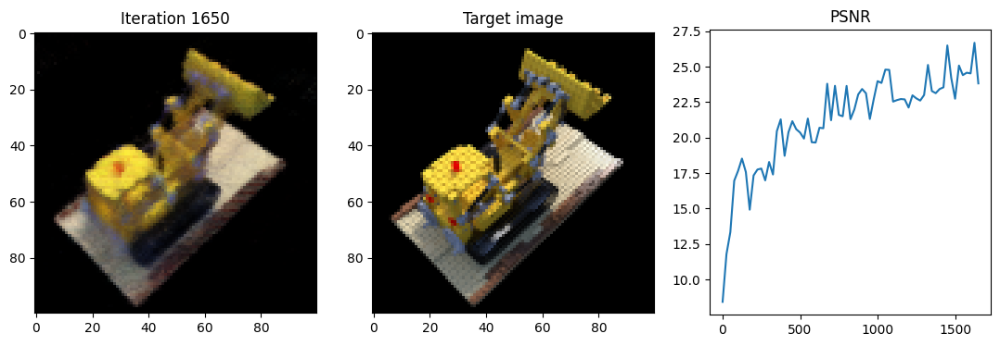

 56%|█████▌    | 1675/3001 [42:41<32:53,  1.49s/it]

Iteration 1675  Loss: 0.0049  PSNR: 23.06  Time: 1.53 secs per iter,  42.78 mins in total


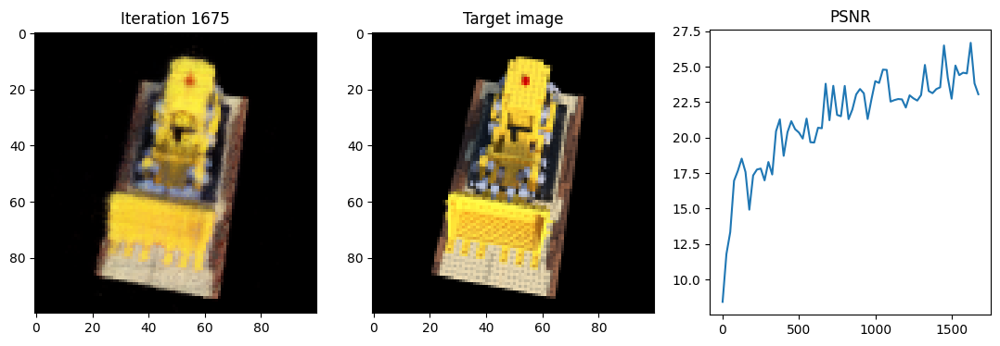

 57%|█████▋    | 1700/3001 [43:19<30:28,  1.41s/it]

Iteration 1700  Loss: 0.0053  PSNR: 22.75  Time: 1.52 secs per iter,  43.41 mins in total


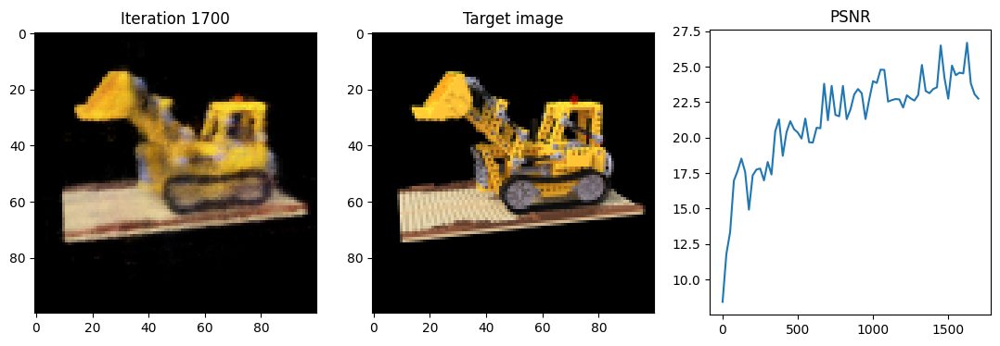

 57%|█████▋    | 1725/3001 [43:57<30:15,  1.42s/it]

Iteration 1725  Loss: 0.0020  PSNR: 26.92  Time: 1.53 secs per iter,  44.05 mins in total


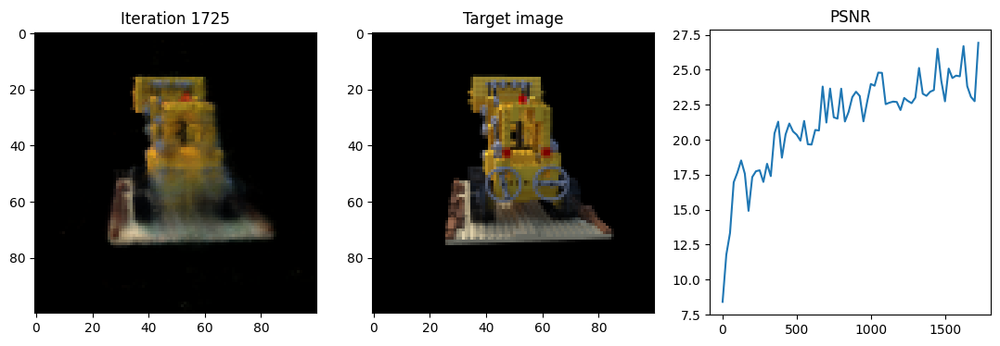

 58%|█████▊    | 1750/3001 [44:36<30:04,  1.44s/it]

Iteration 1750  Loss: 0.0024  PSNR: 26.20  Time: 1.54 secs per iter,  44.69 mins in total


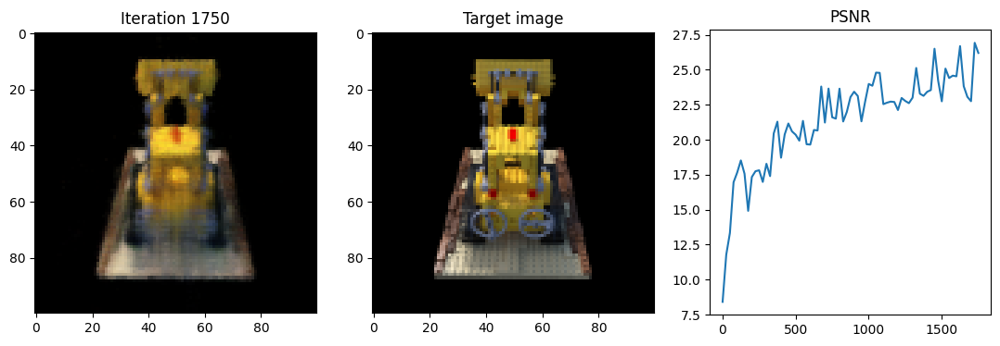

 59%|█████▉    | 1775/3001 [45:14<29:47,  1.46s/it]

Iteration 1775  Loss: 0.0037  PSNR: 24.29  Time: 1.53 secs per iter,  45.33 mins in total


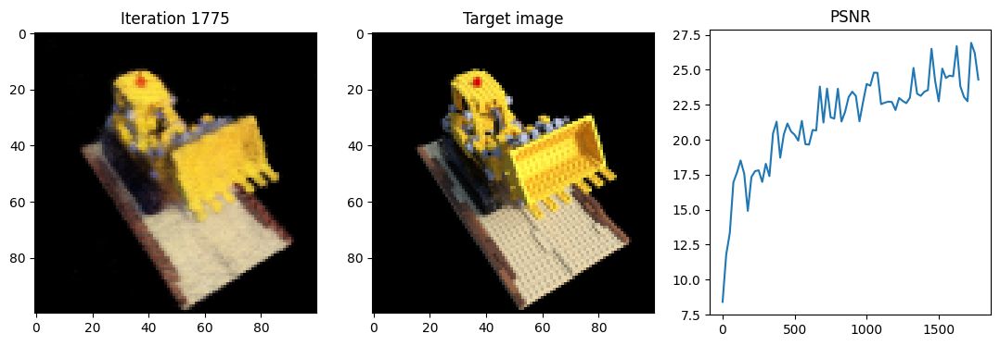

 60%|█████▉    | 1800/3001 [45:52<30:36,  1.53s/it]

Iteration 1800  Loss: 0.0050  PSNR: 23.04  Time: 1.54 secs per iter,  45.96 mins in total


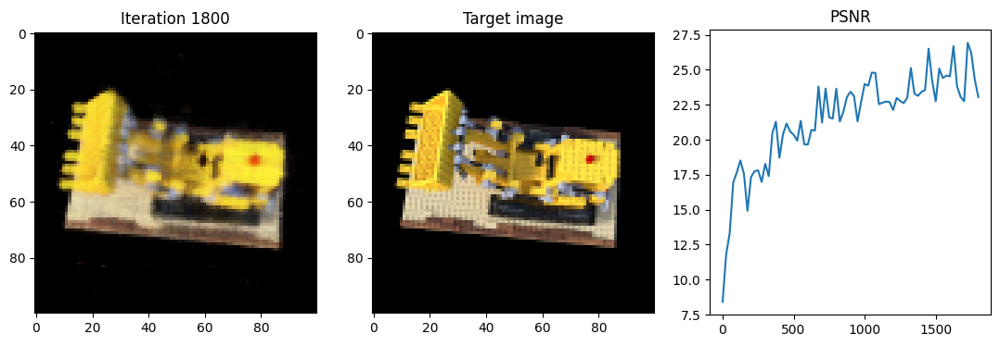

 61%|██████    | 1825/3001 [46:30<28:19,  1.45s/it]

Iteration 1825  Loss: 0.0040  PSNR: 24.01  Time: 1.53 secs per iter,  46.60 mins in total


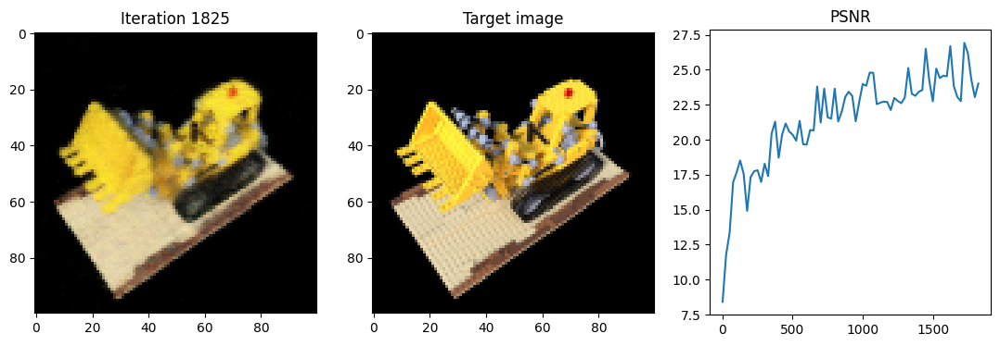

 62%|██████▏   | 1850/3001 [47:08<26:58,  1.41s/it]

Iteration 1850  Loss: 0.0044  PSNR: 23.59  Time: 1.52 secs per iter,  47.24 mins in total


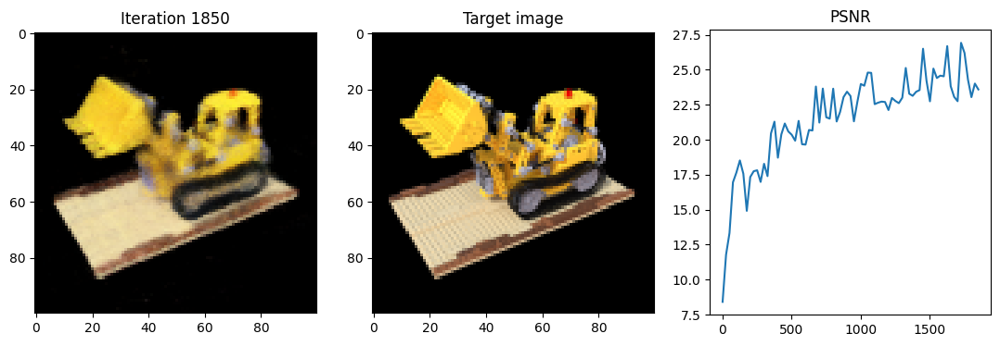

 62%|██████▏   | 1875/3001 [47:47<26:40,  1.42s/it]

Iteration 1875  Loss: 0.0036  PSNR: 24.48  Time: 1.53 secs per iter,  47.87 mins in total


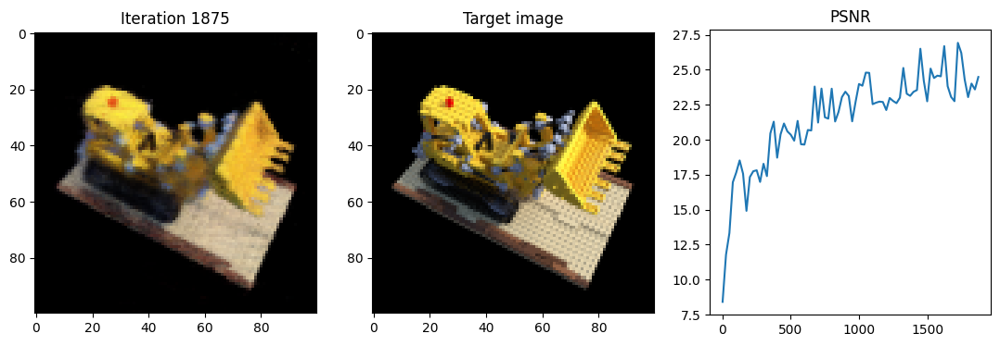

 63%|██████▎   | 1900/3001 [48:25<26:25,  1.44s/it]

Iteration 1900  Loss: 0.0036  PSNR: 24.43  Time: 1.52 secs per iter,  48.51 mins in total


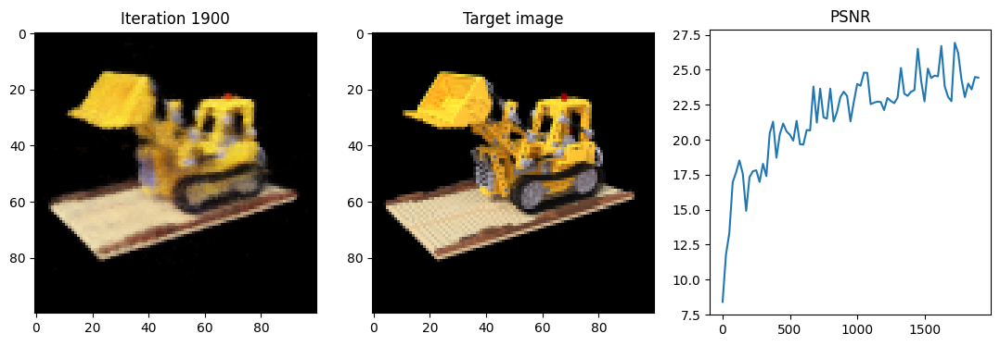

 64%|██████▍   | 1925/3001 [49:03<26:36,  1.48s/it]

Iteration 1925  Loss: 0.0046  PSNR: 23.40  Time: 1.53 secs per iter,  49.14 mins in total


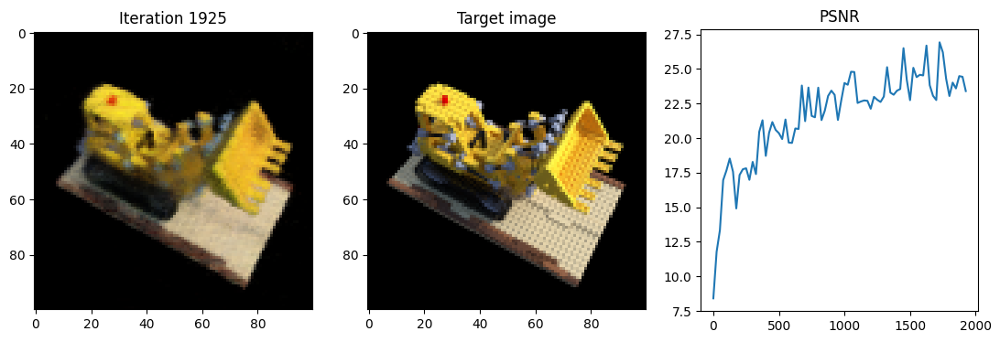

 65%|██████▍   | 1950/3001 [49:41<26:05,  1.49s/it]

Iteration 1950  Loss: 0.0030  PSNR: 25.28  Time: 1.53 secs per iter,  49.78 mins in total


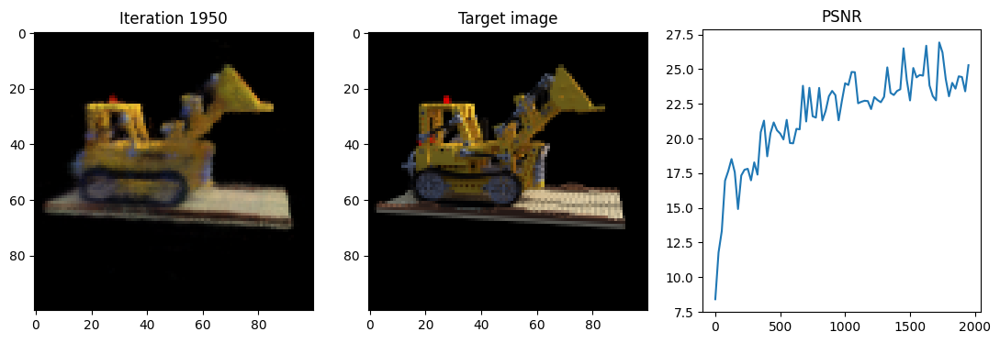

 66%|██████▌   | 1975/3001 [50:19<23:58,  1.40s/it]

Iteration 1975  Loss: 0.0027  PSNR: 25.63  Time: 1.52 secs per iter,  50.41 mins in total


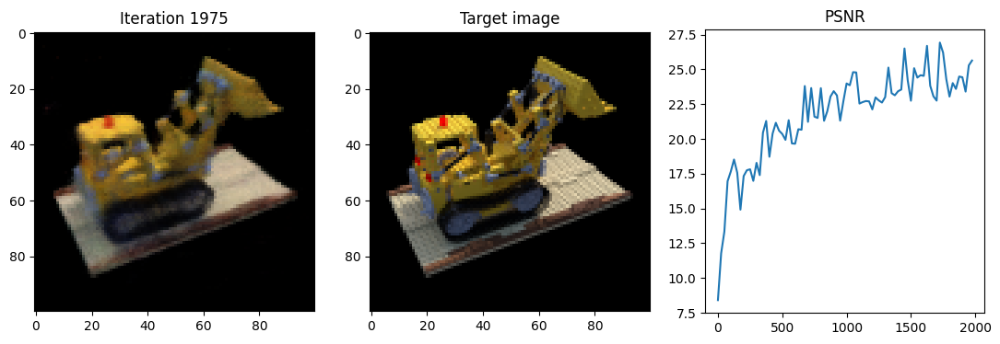

 67%|██████▋   | 2000/3001 [50:57<23:44,  1.42s/it]

Iteration 2000  Loss: 0.0029  PSNR: 25.34  Time: 1.52 secs per iter,  51.05 mins in total


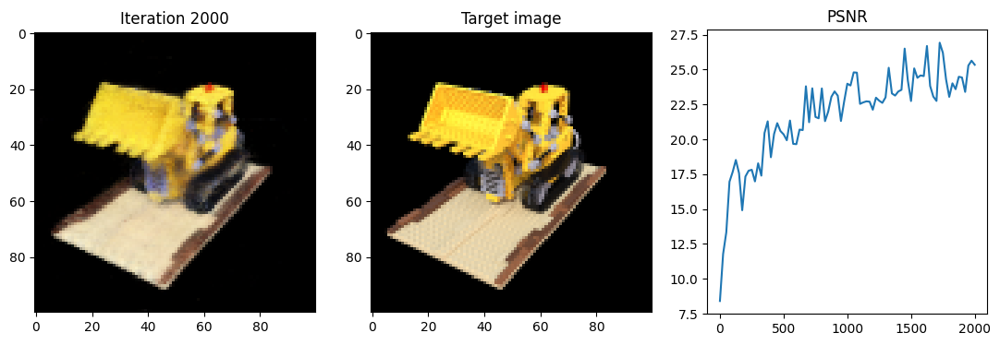

 67%|██████▋   | 2025/3001 [51:36<23:34,  1.45s/it]

Iteration 2025  Loss: 0.0029  PSNR: 25.36  Time: 1.54 secs per iter,  51.69 mins in total


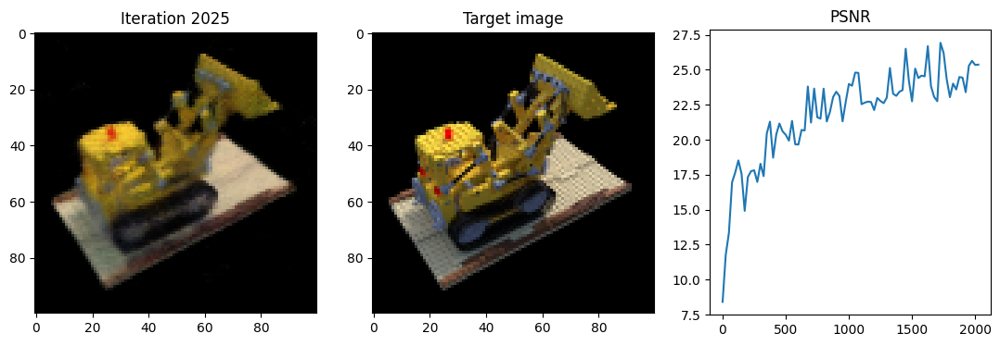

 68%|██████▊   | 2050/3001 [52:14<23:17,  1.47s/it]

Iteration 2050  Loss: 0.0026  PSNR: 25.90  Time: 1.53 secs per iter,  52.33 mins in total


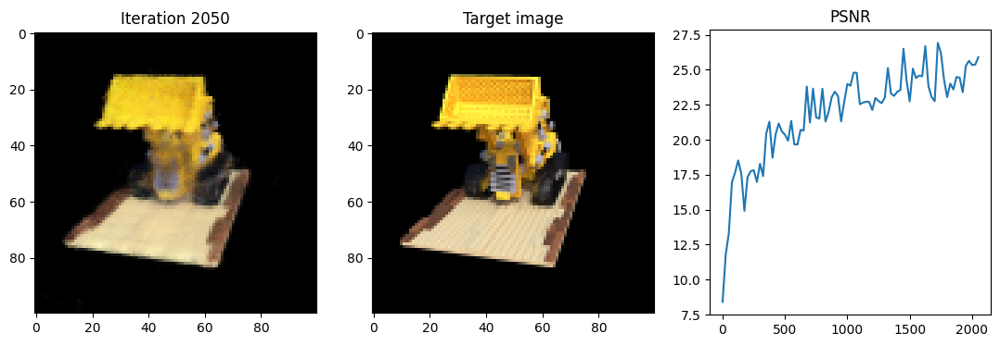

 69%|██████▉   | 2075/3001 [52:53<23:35,  1.53s/it]

Iteration 2075  Loss: 0.0045  PSNR: 23.43  Time: 1.53 secs per iter,  52.97 mins in total


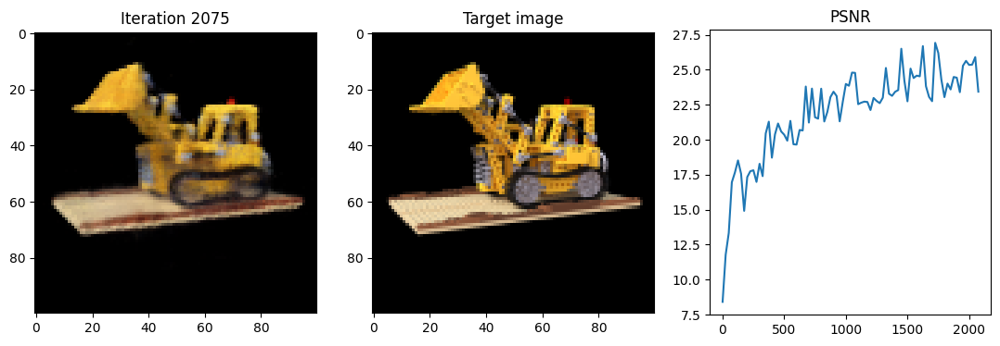

 70%|██████▉   | 2100/3001 [53:30<21:08,  1.41s/it]

Iteration 2100  Loss: 0.0036  PSNR: 24.40  Time: 1.53 secs per iter,  53.60 mins in total


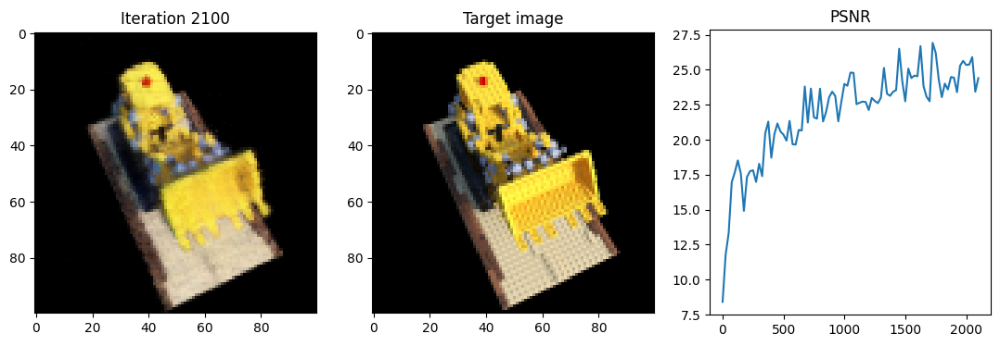

 71%|███████   | 2125/3001 [54:08<20:37,  1.41s/it]

Iteration 2125  Loss: 0.0028  PSNR: 25.50  Time: 1.51 secs per iter,  54.23 mins in total


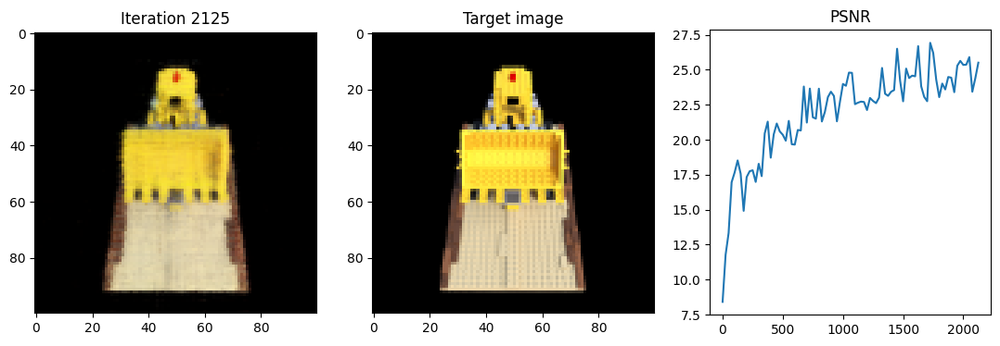

 72%|███████▏  | 2150/3001 [54:47<20:14,  1.43s/it]

Iteration 2150  Loss: 0.0034  PSNR: 24.66  Time: 1.54 secs per iter,  54.87 mins in total


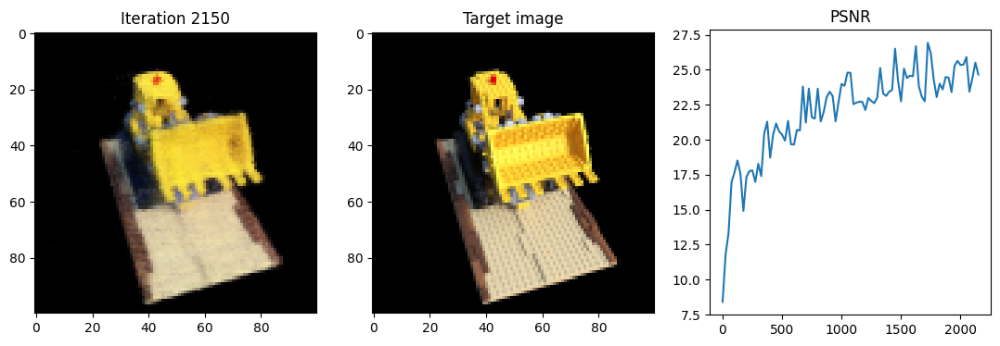

 72%|███████▏  | 2175/3001 [55:25<20:17,  1.47s/it]

Iteration 2175  Loss: 0.0022  PSNR: 26.50  Time: 1.54 secs per iter,  55.52 mins in total


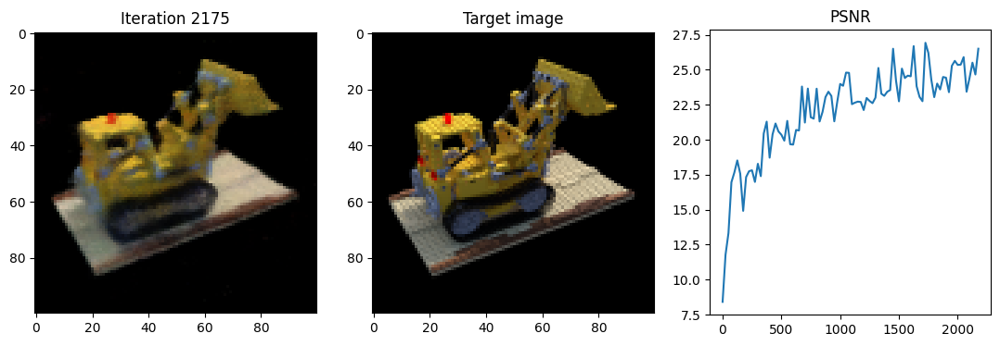

 73%|███████▎  | 2200/3001 [56:04<20:27,  1.53s/it]

Iteration 2200  Loss: 0.0041  PSNR: 23.92  Time: 1.53 secs per iter,  56.15 mins in total


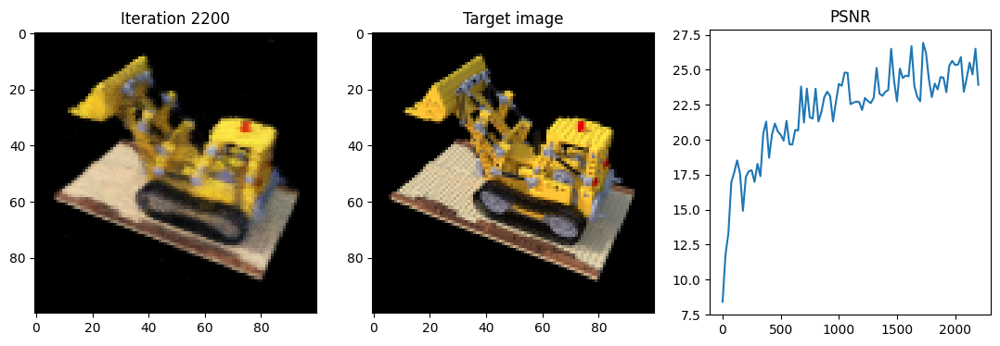

 74%|███████▍  | 2225/3001 [56:42<19:04,  1.48s/it]

Iteration 2225  Loss: 0.0034  PSNR: 24.70  Time: 1.53 secs per iter,  56.79 mins in total


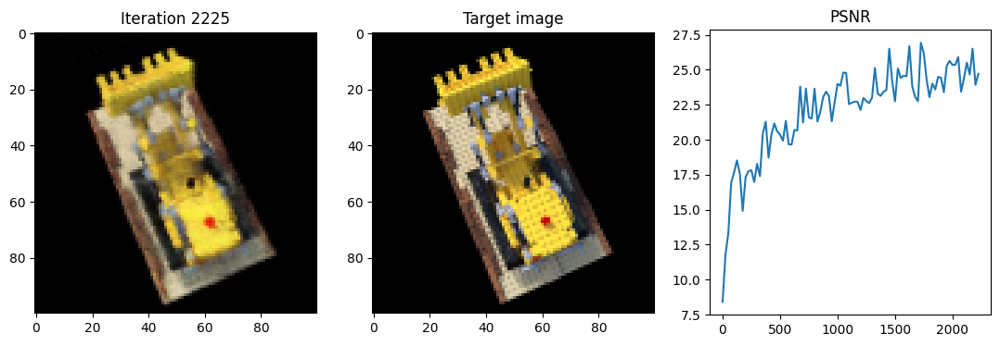

 75%|███████▍  | 2250/3001 [57:20<17:35,  1.41s/it]

Iteration 2250  Loss: 0.0034  PSNR: 24.72  Time: 1.52 secs per iter,  57.43 mins in total


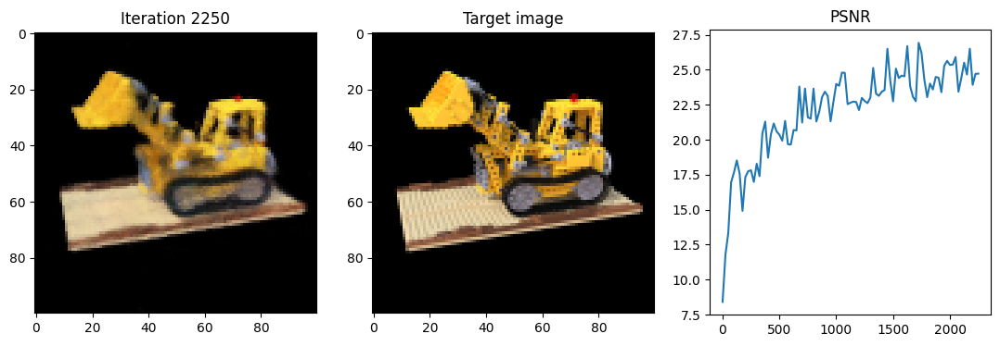

 76%|███████▌  | 2275/3001 [57:58<17:10,  1.42s/it]

Iteration 2275  Loss: 0.0023  PSNR: 26.43  Time: 1.52 secs per iter,  58.06 mins in total


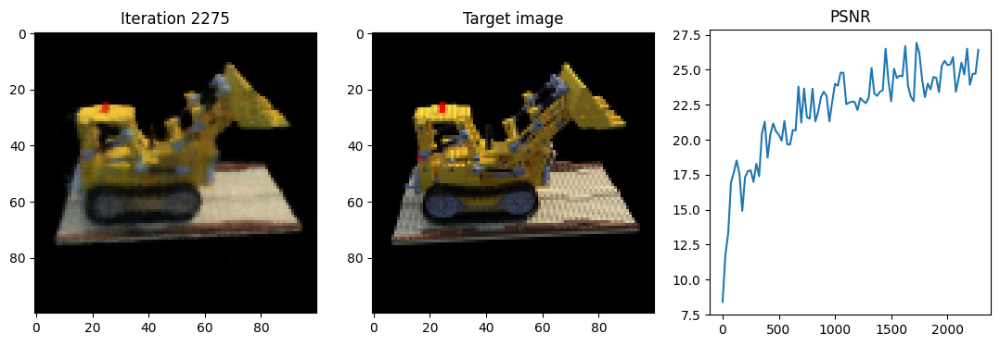

 77%|███████▋  | 2300/3001 [58:36<16:54,  1.45s/it]

Iteration 2300  Loss: 0.0024  PSNR: 26.29  Time: 1.52 secs per iter,  58.70 mins in total


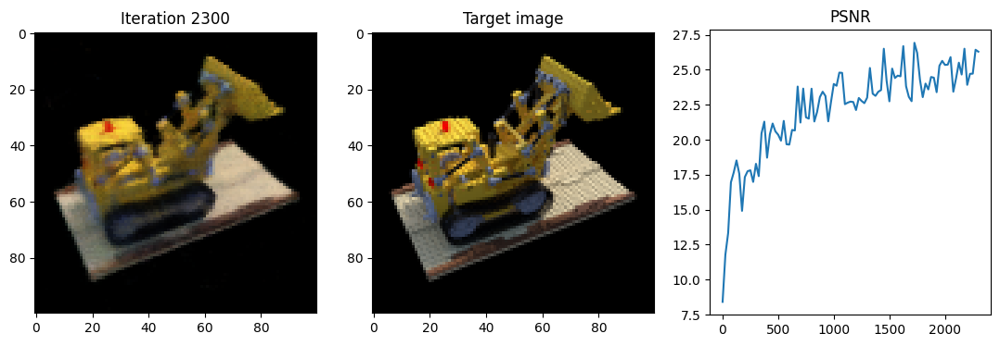

 77%|███████▋  | 2325/3001 [59:15<16:51,  1.50s/it]

Iteration 2325  Loss: 0.0040  PSNR: 23.98  Time: 1.53 secs per iter,  59.33 mins in total


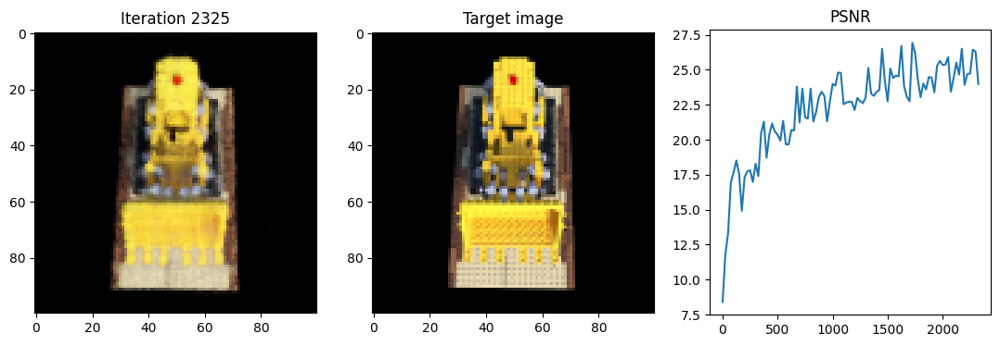

 78%|███████▊  | 2350/3001 [59:52<16:13,  1.49s/it]

Iteration 2350  Loss: 0.0028  PSNR: 25.49  Time: 1.52 secs per iter,  59.97 mins in total


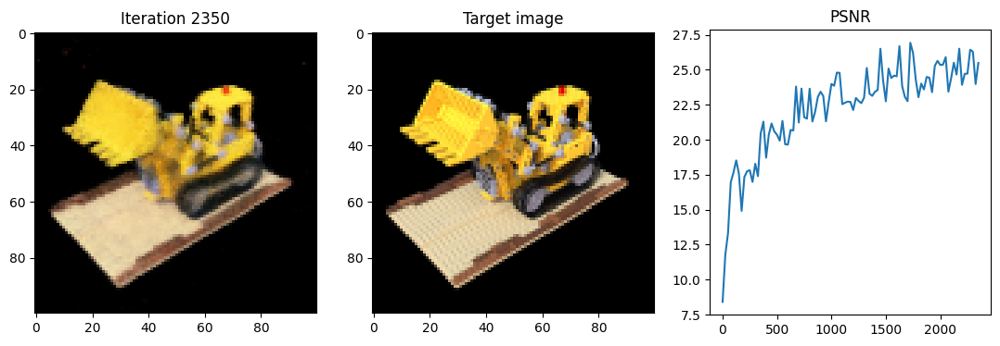

 79%|███████▉  | 2375/3001 [1:00:30<14:42,  1.41s/it]

Iteration 2375  Loss: 0.0022  PSNR: 26.53  Time: 1.53 secs per iter,  60.60 mins in total


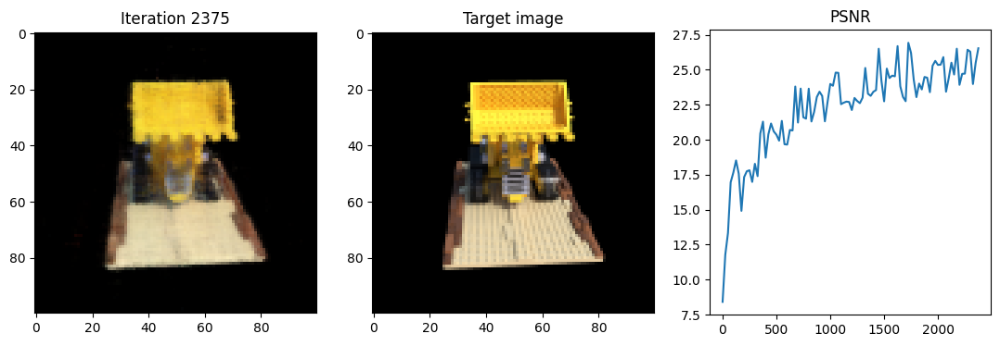

 80%|███████▉  | 2400/3001 [1:01:09<14:10,  1.41s/it]

Iteration 2400  Loss: 0.0030  PSNR: 25.23  Time: 1.52 secs per iter,  61.24 mins in total


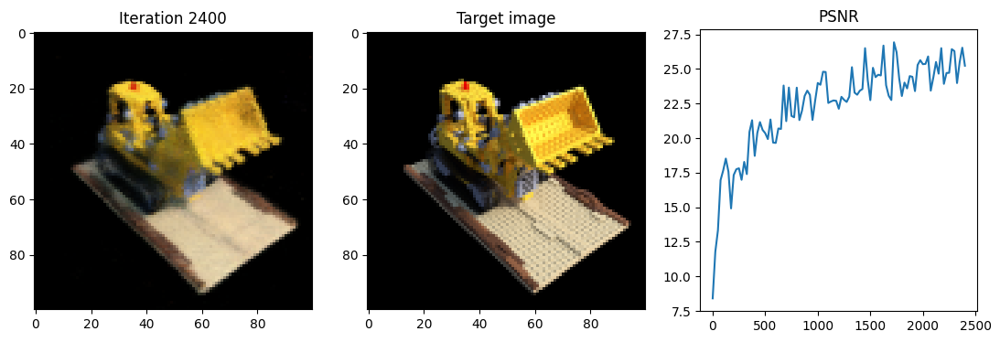

 81%|████████  | 2425/3001 [1:01:48<13:59,  1.46s/it]

Iteration 2425  Loss: 0.0030  PSNR: 25.21  Time: 1.55 secs per iter,  61.88 mins in total


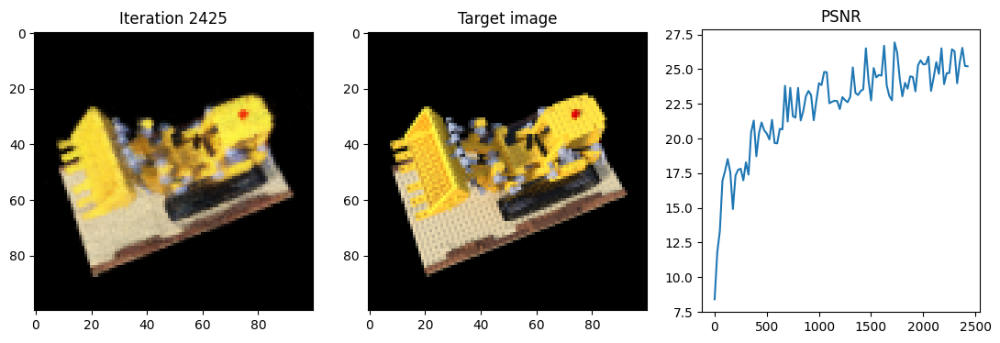

 82%|████████▏ | 2450/3001 [1:02:26<13:25,  1.46s/it]

Iteration 2450  Loss: 0.0037  PSNR: 24.30  Time: 1.53 secs per iter,  62.52 mins in total


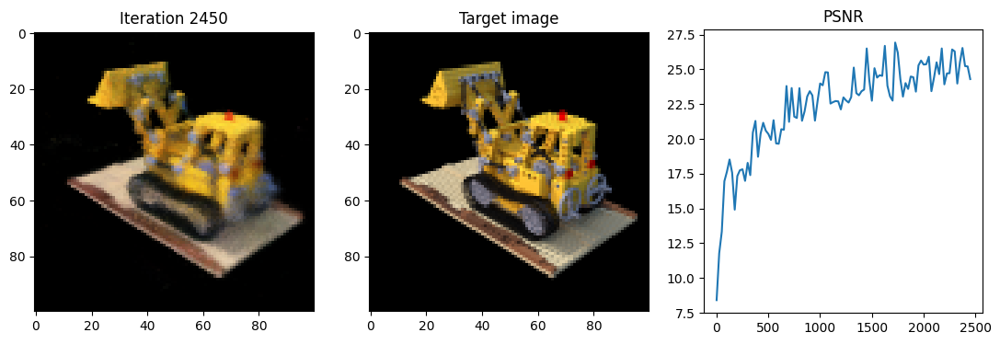

 82%|████████▏ | 2475/3001 [1:03:04<13:23,  1.53s/it]

Iteration 2475  Loss: 0.0018  PSNR: 27.48  Time: 1.53 secs per iter,  63.16 mins in total


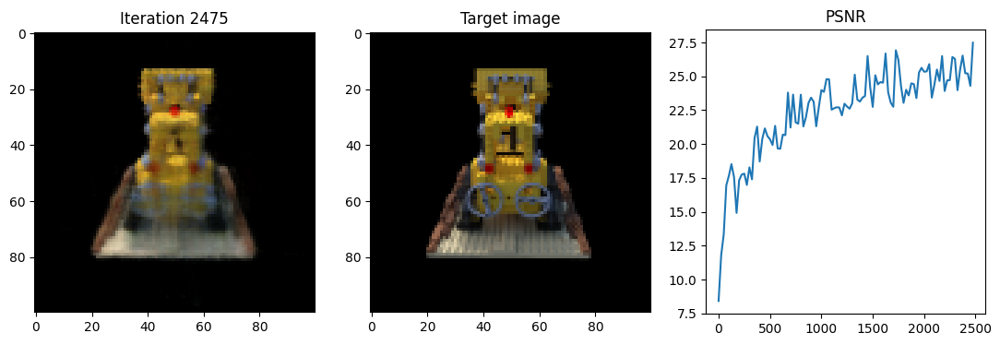

 83%|████████▎ | 2500/3001 [1:03:42<11:48,  1.41s/it]

Iteration 2500  Loss: 0.0031  PSNR: 25.09  Time: 1.53 secs per iter,  63.80 mins in total


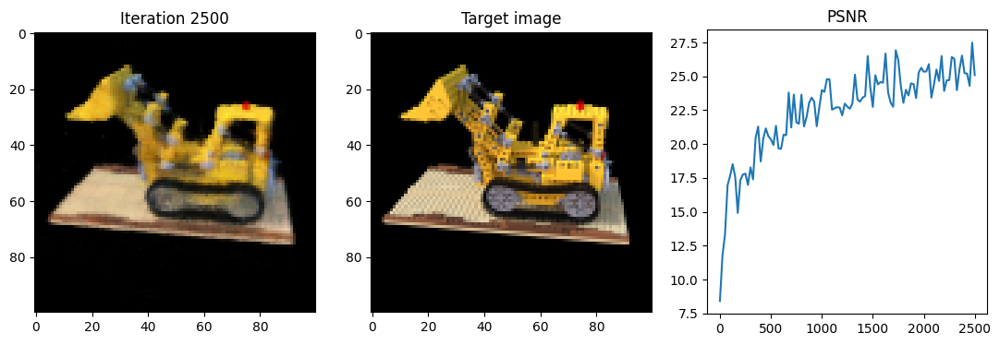

 84%|████████▍ | 2525/3001 [1:04:20<11:13,  1.42s/it]

Iteration 2525  Loss: 0.0036  PSNR: 24.40  Time: 1.51 secs per iter,  64.43 mins in total


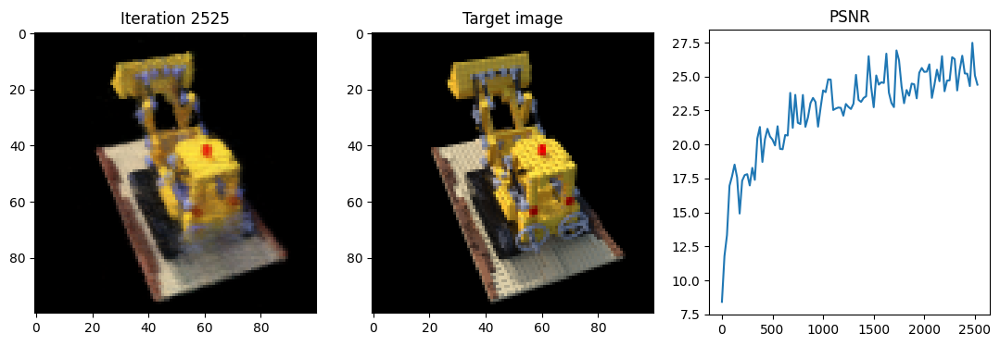

 85%|████████▍ | 2550/3001 [1:04:58<10:40,  1.42s/it]

Iteration 2550  Loss: 0.0015  PSNR: 28.16  Time: 1.53 secs per iter,  65.06 mins in total


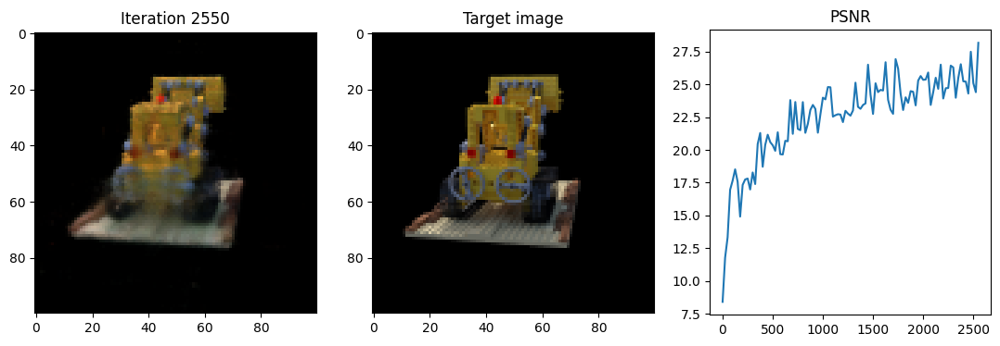

 86%|████████▌ | 2575/3001 [1:05:37<10:25,  1.47s/it]

Iteration 2575  Loss: 0.0018  PSNR: 27.45  Time: 1.53 secs per iter,  65.70 mins in total


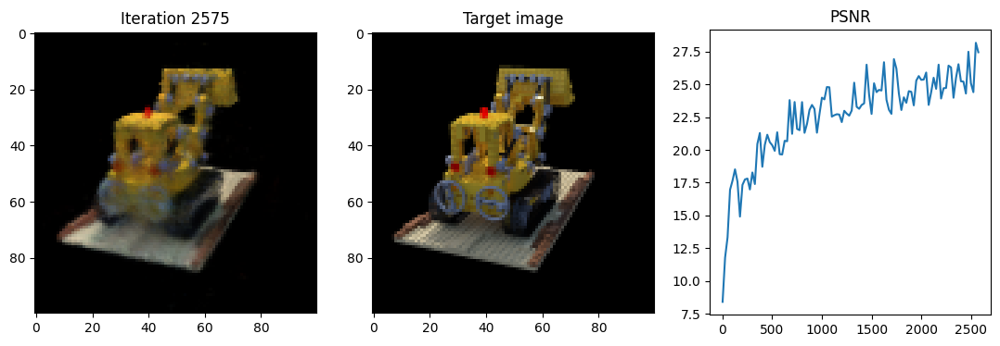

 87%|████████▋ | 2600/3001 [1:06:15<10:19,  1.54s/it]

Iteration 2600  Loss: 0.0024  PSNR: 26.15  Time: 1.54 secs per iter,  66.34 mins in total


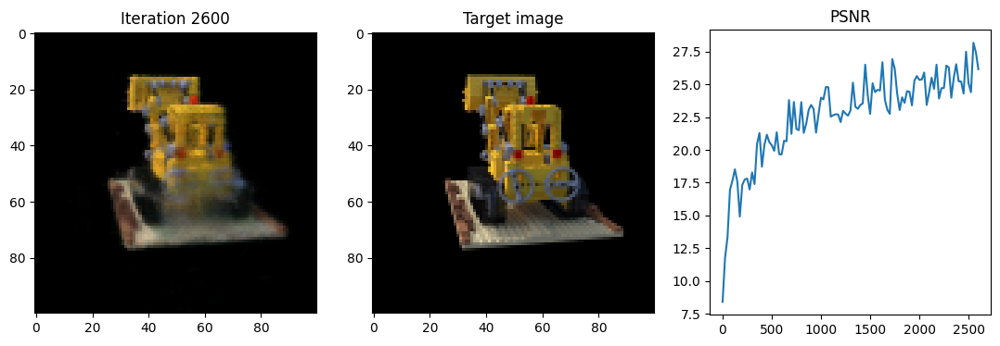

 87%|████████▋ | 2625/3001 [1:06:53<09:19,  1.49s/it]

Iteration 2625  Loss: 0.0018  PSNR: 27.34  Time: 1.53 secs per iter,  66.98 mins in total


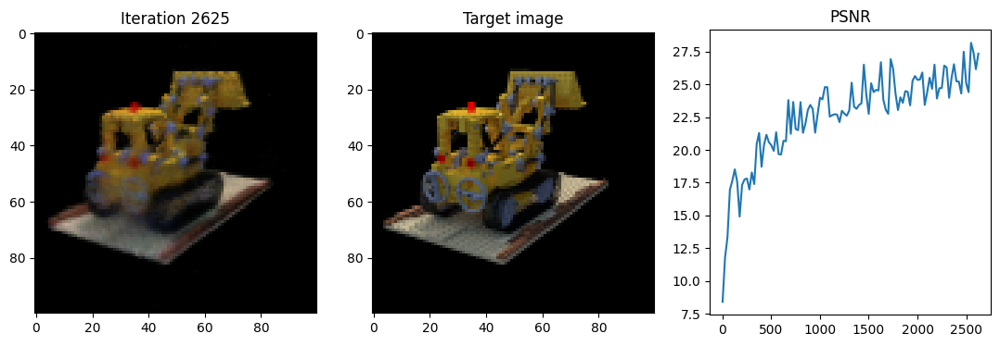

 88%|████████▊ | 2650/3001 [1:07:31<08:15,  1.41s/it]

Iteration 2650  Loss: 0.0024  PSNR: 26.17  Time: 1.52 secs per iter,  67.61 mins in total


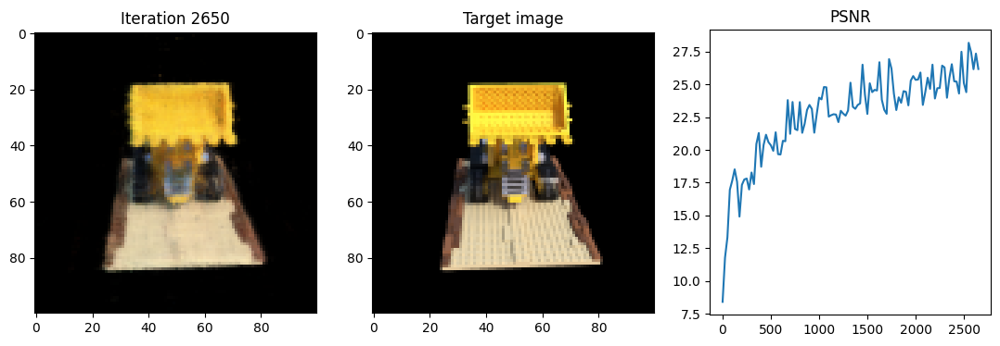

 89%|████████▉ | 2675/3001 [1:08:10<07:45,  1.43s/it]

Iteration 2675  Loss: 0.0020  PSNR: 26.97  Time: 1.53 secs per iter,  68.25 mins in total


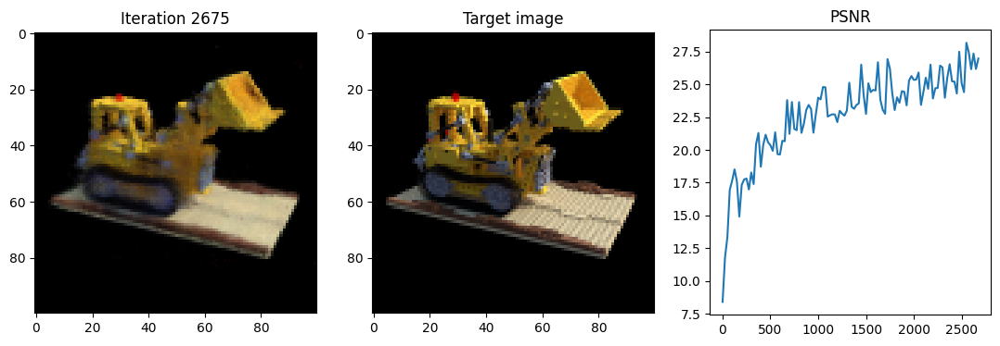

 90%|████████▉ | 2700/3001 [1:08:48<07:24,  1.48s/it]

Iteration 2700  Loss: 0.0048  PSNR: 23.22  Time: 1.54 secs per iter,  68.89 mins in total


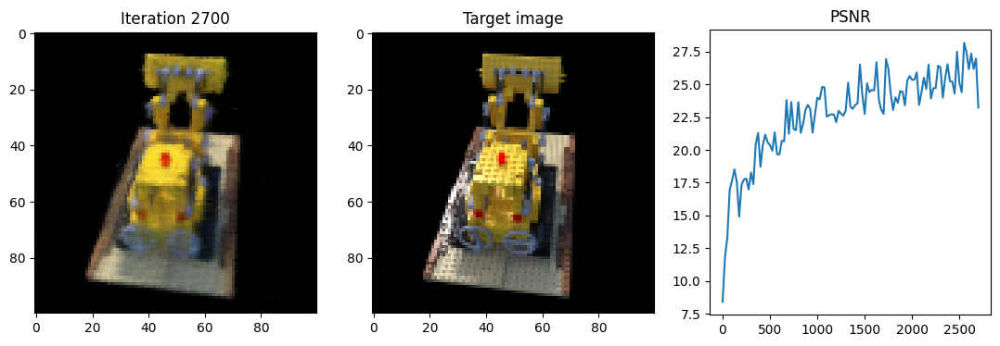

 91%|█████████ | 2725/3001 [1:09:26<06:48,  1.48s/it]

Iteration 2725  Loss: 0.0026  PSNR: 25.87  Time: 1.53 secs per iter,  69.53 mins in total


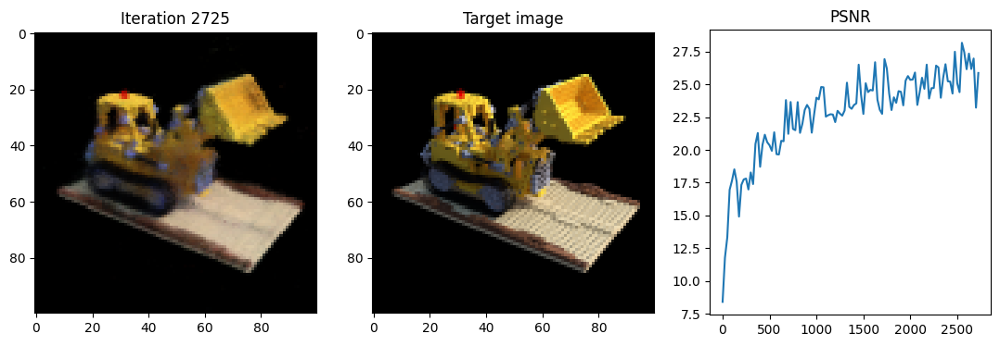

 92%|█████████▏| 2750/3001 [1:10:04<06:11,  1.48s/it]

Iteration 2750  Loss: 0.0031  PSNR: 25.03  Time: 1.54 secs per iter,  70.17 mins in total


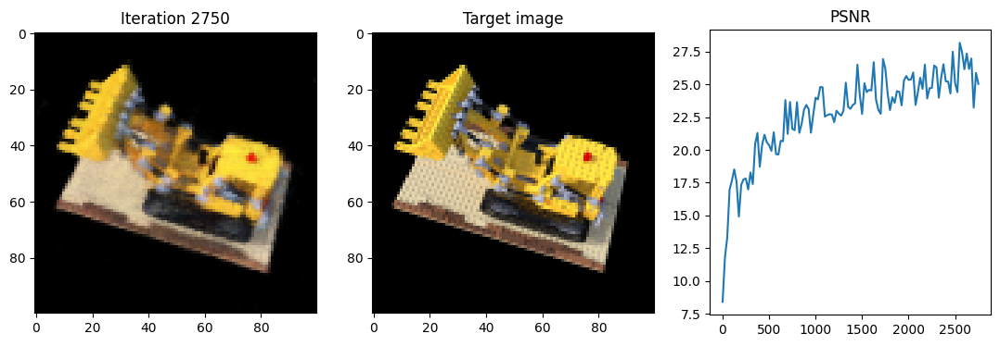

 92%|█████████▏| 2775/3001 [1:10:42<05:20,  1.42s/it]

Iteration 2775  Loss: 0.0027  PSNR: 25.75  Time: 1.52 secs per iter,  70.80 mins in total


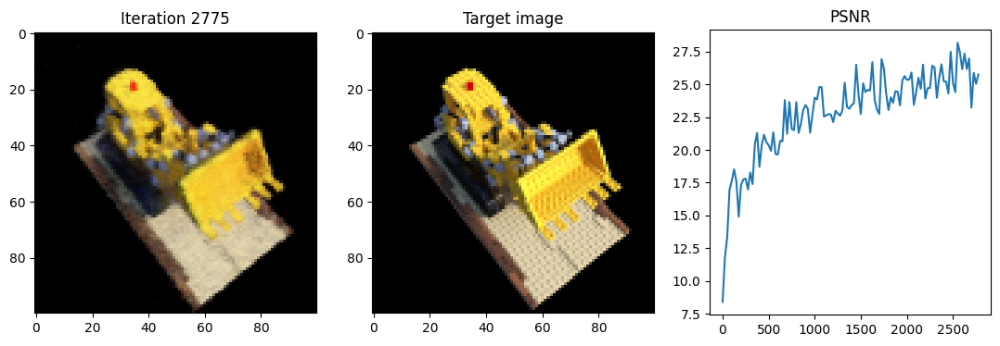

 93%|█████████▎| 2800/3001 [1:11:21<04:44,  1.42s/it]

Iteration 2800  Loss: 0.0025  PSNR: 26.06  Time: 1.54 secs per iter,  71.44 mins in total


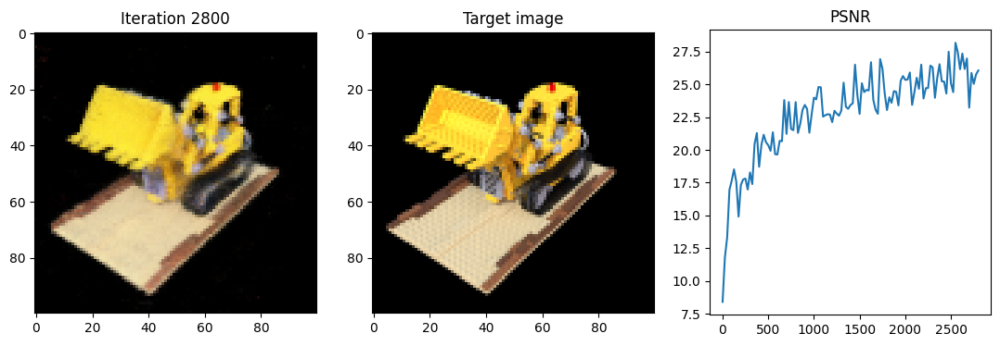

 94%|█████████▍| 2825/3001 [1:11:59<04:13,  1.44s/it]

Iteration 2825  Loss: 0.0022  PSNR: 26.65  Time: 1.53 secs per iter,  72.08 mins in total


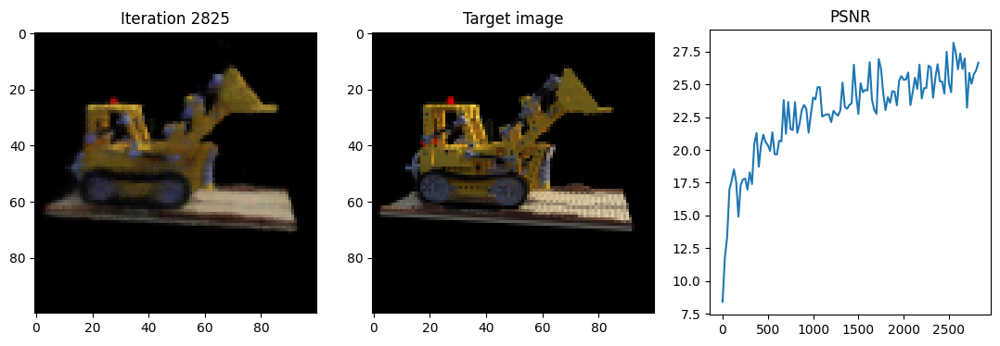

 95%|█████████▍| 2850/3001 [1:12:38<03:45,  1.49s/it]

Iteration 2850  Loss: 0.0021  PSNR: 26.78  Time: 1.53 secs per iter,  72.72 mins in total


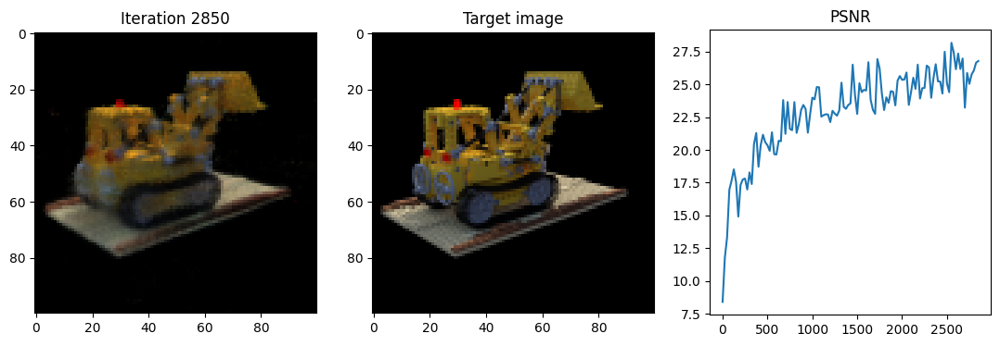

 96%|█████████▌| 2875/3001 [1:13:16<03:05,  1.48s/it]

Iteration 2875  Loss: 0.0037  PSNR: 24.29  Time: 1.53 secs per iter,  73.36 mins in total


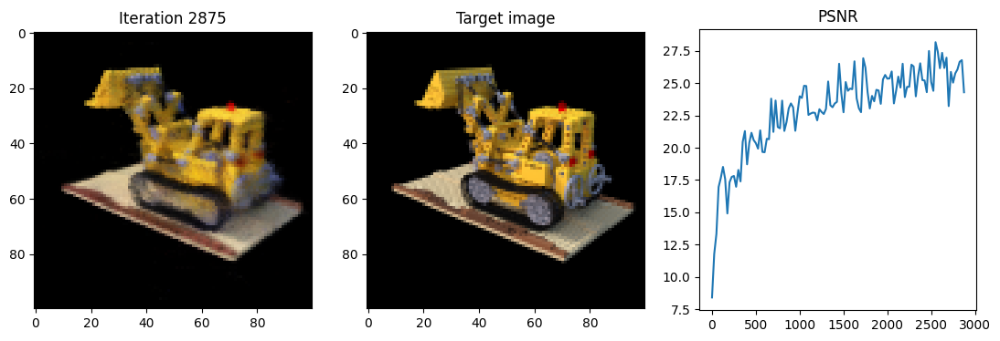

 97%|█████████▋| 2900/3001 [1:13:54<02:22,  1.42s/it]

Iteration 2900  Loss: 0.0027  PSNR: 25.61  Time: 1.52 secs per iter,  73.99 mins in total


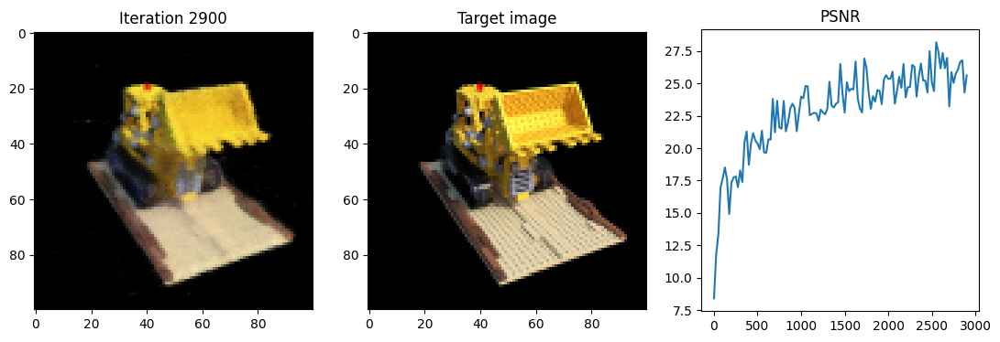

 97%|█████████▋| 2925/3001 [1:14:33<01:48,  1.43s/it]

Iteration 2925  Loss: 0.0023  PSNR: 26.47  Time: 1.54 secs per iter,  74.64 mins in total


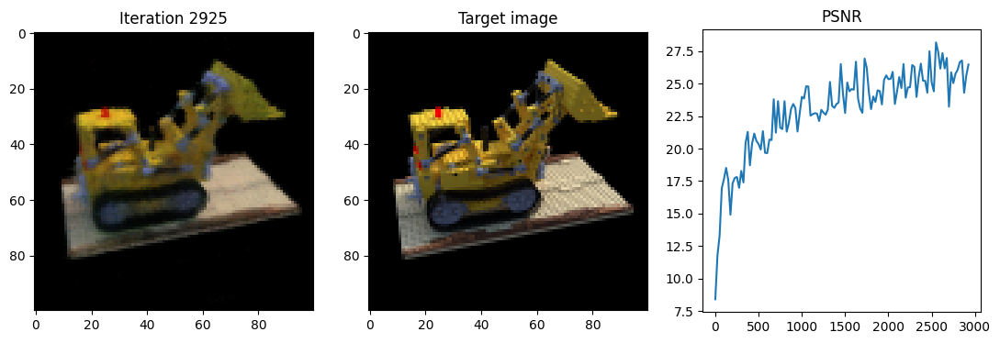

 98%|█████████▊| 2950/3001 [1:15:11<01:13,  1.45s/it]

Iteration 2950  Loss: 0.0027  PSNR: 25.70  Time: 1.54 secs per iter,  75.28 mins in total


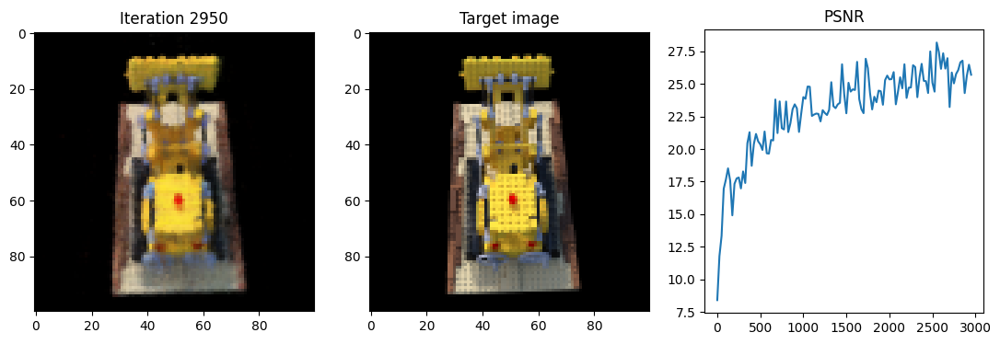

 99%|█████████▉| 2975/3001 [1:15:50<00:39,  1.51s/it]

Iteration 2975  Loss: 0.0024  PSNR: 26.23  Time: 1.55 secs per iter,  75.92 mins in total


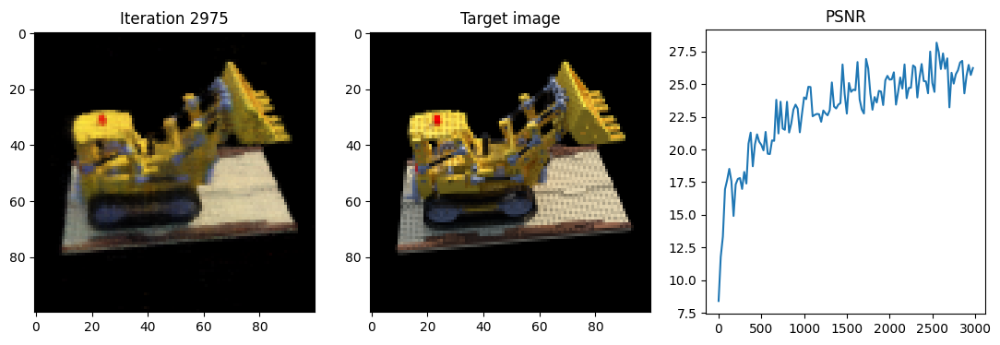

100%|█████████▉| 3000/3001 [1:16:28<00:01,  1.52s/it]

Iteration 3000  Loss: 0.0031  PSNR: 25.12  Time: 1.54 secs per iter,  76.56 mins in total


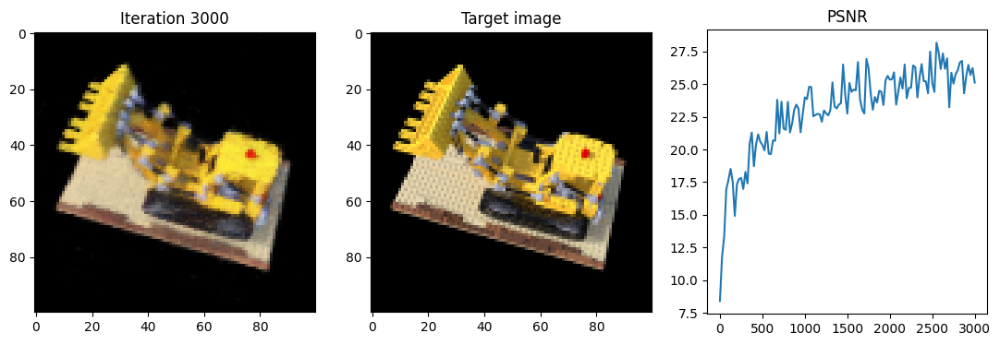

100%|██████████| 3001/3001 [1:16:32<00:00,  1.53s/it]

Done!


In [ ]:
height, width = images.shape[1:3]
for i in tqdm(range(1)):#iterations+1)):

    #############################  TODO 2.6 BEGIN  ############################

    # choose randomly a picture for the forward pass
    sample = i%(len(images)-1)
    image = images[sample].squeeze(0).float()
    pose = poses[sample].squeeze(0).float()


    # Run one iteration of NeRF and get the rendered RGB image.
    rec_image = one_forward_pass(height, width, intrinsics, pose,
                                 near, far, samples, model, num_x_frequencies, num_d_frequencies)

    # Compute mean-squared error between the predicted and target images. Backprop!
    loss = F.mse_loss(rec_image, image)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    #############################  TODO 2.6 END  ############################

    # Display images/plots/stats
    if i % display == 0:
        with torch.no_grad():
            #############################  TODO 2.6 BEGIN  ############################
            # Render the held-out view
            test_rec_image = one_forward_pass(height, width, intrinsics, pose, near, far,
                                              samples, model, num_x_frequencies, num_d_frequencies).reshape(height, width, 3)

            # calculate the loss and the psnr between the original test image and the reconstructed one.
            test_image = image.reshape(height, width, 3)
            loss = F.mse_loss(test_rec_image, test_image)
            psnr = 10 * torch.log10(1 / loss)

            #############################  TODO 2.6 END  ############################

        print("Iteration %d " % i, "Loss: %.4f " % loss.item(), "PSNR: %.2f " % psnr.item(),
              "Time: %.2f secs per iter, " % ((time.time() - t) / display), "%.2f mins in total" % ((time.time() - t0)/60))

        t = time.time()
        psnrs.append(psnr.item())
        iternums.append(i)

        plt.figure(figsize=(18, 4))
        plt.subplot(141)
        plt.imshow(test_rec_image.detach().cpu().numpy())
        plt.title(f"Iteration {i}")
        plt.subplot(142)
        plt.imshow(test_image.detach().cpu().numpy())
        plt.title("Target image")
        plt.subplot(143)
        plt.plot(iternums, psnrs)
        plt.title("PSNR")
        plt.savefig(gif_path+f'/{i}.png')
        plt.show()

print('Done!')


In [ ]:
model.state_dict

<bound method Module.state_dict of nerf_model(
  (layer1): Linear(in_features=63, out_features=256, bias=True)
  (layer2): Linear(in_features=256, out_features=256, bias=True)
  (layer3): Linear(in_features=256, out_features=256, bias=True)
  (layer4): Linear(in_features=256, out_features=256, bias=True)
  (layer5): Linear(in_features=256, out_features=256, bias=True)
  (layer6): Linear(in_features=319, out_features=256, bias=True)
  (layer7): Linear(in_features=256, out_features=256, bias=True)
  (layer8): Linear(in_features=256, out_features=256, bias=True)
  (layer9): Linear(in_features=256, out_features=1, bias=True)
  (layer10): Linear(in_features=256, out_features=256, bias=True)
  (layer11): Linear(in_features=283, out_features=128, bias=True)
  (layer12): Linear(in_features=128, out_features=3, bias=True)
  (relu): ReLU()
  (sigmoid): Sigmoid()
)>

In [ ]:
path = f'/content/gdrive/My Drive/Nerf2.pth'

In [ ]:
torch.save(model.state_dict(), path)